In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.offline
from plotly.subplots import make_subplots
import plotly.express as px
from sklearn.preprocessing import MinMaxScaler

from pptoolbox.platform.preprocessing import preprocess_v2
from pptoolbox.preprocessing import SNV, MSC, SavitzkyGolay, Detrend
from pptoolbox.visualization import (plot_spectra, plot_loadings, plot_scree, fit_pca,
                                               generate_pc_df, plot_svp, initialize_theme, spectral_vector_properties)

from sklearn.feature_selection import f_classif, mutual_info_classif, chi2

from pathlib import Path

In [3]:
# plotly.offline.init_notebook_mode()
# qualitative_cmap, diverging_cmap, light_cmap = initialize_theme()

# import

In [144]:
import os
import sys
sys.path.append(os.path.dirname(os.getcwd()))

raw_df = pd.read_csv('../data/raw/spectra_241216.csv')
label_df = pd.read_csv('../data/processed/label.csv')
print(raw_df.shape, label_df.shape)

(73, 35) (73, 8)


In [145]:
raw_df = raw_df.rename(columns={'calc_data_mini':'raw_data_mini','calc_data_neo':'raw_data_neo'})
raw_df['raw_data'] = np.nan

raw_df_og = raw_df.copy(deep=True)
raw_df.head()

,lot_id,active,analyzer_id,raw_data_mini,raw_data_neo,company_id,dark_ref_data_mini,dark_ref_data_neo,dark_ref_scan_time,date_scanned,...,white_ref_scan_time,raw_data,dark_ref_data,white_ref_data,scope_data,specimen_id,lot_name,analyser_id,product_id,product_name
0,86843,1,105,"[{""wavelength"": 290.0734558105469, ""reflectanc...","[{""wavelength"": 926.3883666992188, ""reflectanc...",1323,"[-4.95068883895874, -3.087045431137085, -0.356...","[25.34874725341797, 27.848241806030273, 16.796...",1734327570,1734329996,...,1734327813,NaN,NaN,NaN,NaN,511007,D0T100_S_LPG_r1,105,6752,Palm Sugar
1,86843,1,105,"[{""wavelength"": 290.0734558105469, ""reflectanc...","[{""wavelength"": 926.3883666992188, ""reflectanc...",1323,"[-4.95068883895874, -3.087045431137085, -0.356...","[25.34874725341797, 27.848241806030273, 16.796...",1734327570,1734330044,...,1734327813,NaN,NaN,NaN,NaN,511014,D0T100_S_LPG_r1,105,6752,Palm Sugar
2,86843,1,105,"[{""wavelength"": 290.0734558105469, ""reflectanc...","[{""wavelength"": 926.3883666992188, ""reflectanc...",1323,"[-4.95068883895874, -3.087045431137085, -0.356...","[25.34874725341797, 27.848241806030273, 16.796...",1734327570,1734330082,...,1734327813,NaN,NaN,NaN,NaN,511019,D0T100_S_LPG_r1,105,6752,Palm Sugar
3,86843,1,105,"[{""wavelength"": 290.0734558105469, ""reflectanc...","[{""wavelength"": 926.3883666992188, ""reflectanc...",1323,"[-4.95068883895874, -3.087045431137085, -0.356...","[25.34874725341797, 27.848241806030273, 16.796...",1734327570,1734330117,...,1734327813,NaN,NaN,NaN,NaN,511024,D0T100_S_LPG_r1,105,6752,Palm Sugar
4,86846,1,105,"[{""wavelength"": 290.0734558105469, ""reflectanc...","[{""wavelength"": 926.3883666992188, ""reflectanc...",1323,"[-4.95068883895874, -3.087045431137085, -0.356...","[25.34874725341797, 27.848241806030273, 16.796...",1734327570,1734330429,...,1734327813,NaN,NaN,NaN,NaN,511043,D5T95_S_LPG_r1,105,6752,Palm Sugar


# select label

In [146]:
filter = [
    'Coconut Sugar'
    ]
label = filter[0]
# label_df = label_df[label_df['Processing']==label]
# label_df.shape

In [147]:
label_df

,lot_id,lot_name,Dwarf,Tall,Preservative,Farm,replicate,ABOVE_BELOW_5pct_Dwarf
0,86843,D0T100_S_LPG_r1,0,100,Sulfite,LPG,r1,0-5PCT
1,86843,D0T100_S_LPG_r1,0,100,Sulfite,LPG,r1,0-5PCT
2,86843,D0T100_S_LPG_r1,0,100,Sulfite,LPG,r1,0-5PCT
3,86843,D0T100_S_LPG_r1,0,100,Sulfite,LPG,r1,0-5PCT
4,86846,D5T95_S_LPG_r1,5,95,Sulfite,LPG,r1,0-5PCT
...,...,...,...,...,...,...,...,...
68,86857,D40T60_S_LPG_r3,40,60,Sulfite,LPG,r3,ABOVE 5PCT
69,86860,D100T0_S_LPG_r3,100,0,Sulfite,LPG,r3,ABOVE 5PCT
70,86860,D100T0_S_LPG_r3,100,0,Sulfite,LPG,r3,ABOVE 5PCT
71,86860,D100T0_S_LPG_r3,100,0,Sulfite,LPG,r3,ABOVE 5PCT


In [110]:
# label_df=label_df[label_df["Dwarf"]!=100]
# label_df

In [148]:
label_df_og = label_df.copy(deep=True)
label_df = label_df.drop(columns=['lot_name'])
X_visnir, X_exnir, label_df, datatype = preprocess_v2(raw_df, label_df)

In [149]:
X_visnir.shape, X_exnir.shape

((73, 191), (73, 89))

In [113]:
spectra = dict({
    'visnir' : X_visnir,
    'exnir' : X_exnir
})

In [114]:
label_df['Dwarf']=label_df['Dwarf'].astype('float')
label_df['Tall']=label_df['Tall'].astype('float')
label_df

,Dwarf,Tall,Preservative,Farm,replicate,ABOVE_BELOW_5pct_Dwarf
lot_id,,,,,,
86843,0.0,100.0,Sulfite,LPG,r1,0-5PCT
86843,0.0,100.0,Sulfite,LPG,r1,0-5PCT
86843,0.0,100.0,Sulfite,LPG,r1,0-5PCT
86843,0.0,100.0,Sulfite,LPG,r1,0-5PCT
86844,0.0,100.0,Sulfite,LPG,r2,0-5PCT
...,...,...,...,...,...,...
86859,100.0,0.0,Sulfite,LPG,r2,ABOVE 5PCT
86860,100.0,0.0,Sulfite,LPG,r3,ABOVE 5PCT
86860,100.0,0.0,Sulfite,LPG,r3,ABOVE 5PCT


In [115]:
label_df = label_df[['Dwarf','replicate','ABOVE_BELOW_5pct_Dwarf']]
label_type_list = ['reg','clf','clf']
param_label_map = dict(zip(label_df.columns, label_type_list))
param_label_map

{'Dwarf': 'reg', 'replicate': 'clf', 'ABOVE_BELOW_5pct_Dwarf': 'clf'}

# Check for Outliers

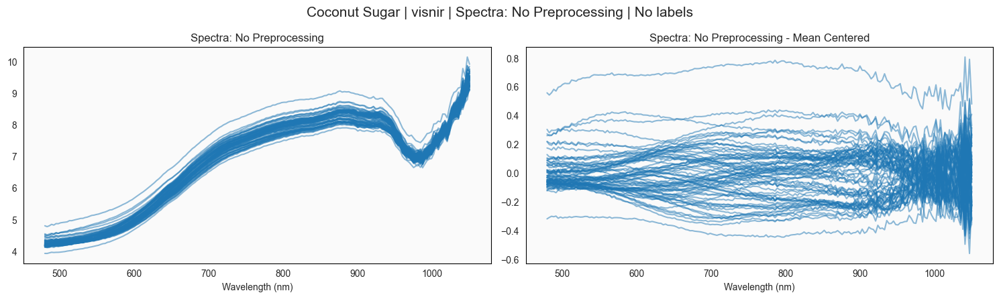

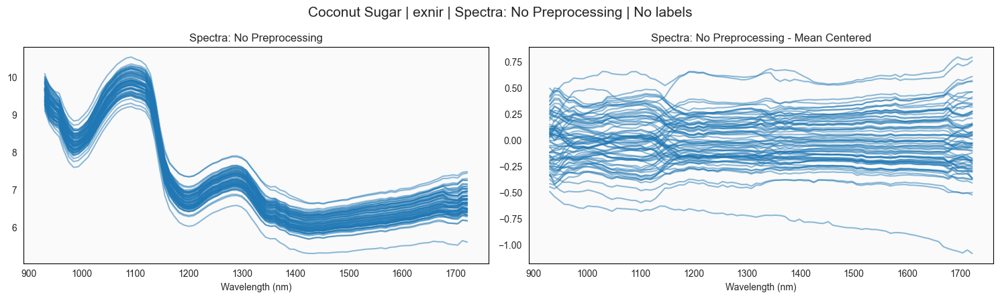

In [116]:
PREPROCESSING = 'No Preprocessing'
SAMPLE_TYPE = f'{label}'
cmap=sns.color_palette()

for spectrum in spectra:
    SAMPLE_TYPE = f'{label} | {spectrum}'
    raw_df = spectra[spectrum]

    plot_spectra(raw_df, labels=None,
             spec_prep=PREPROCESSING,
             sample_type=SAMPLE_TYPE,
             cmap=cmap);

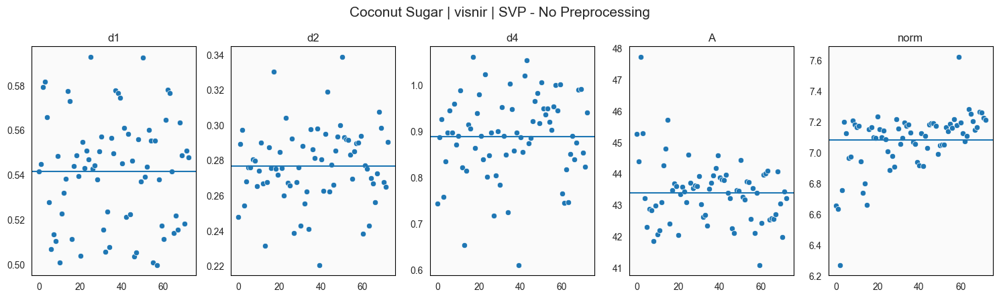

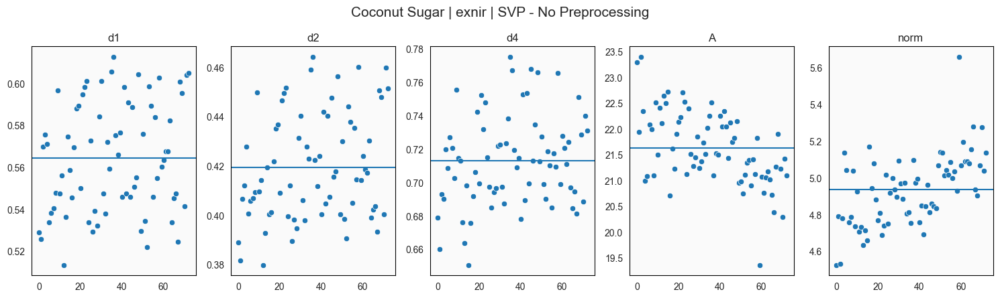

In [117]:
for spectrum in spectra:
    SAMPLE_TYPE = f'{label} | {spectrum}'
    raw_df = spectra[spectrum]
    plot_svp(raw_df, title=f'{label} | {spectrum} | SVP - No Preprocessing')

## identify outlier sample

In [122]:
cutoff = {
    "visnir":{
        "maxval":7.4,
        "minval":6.4
    },
    "exnir":{
        "maxval":5.4,
        "minval":0
    }
}

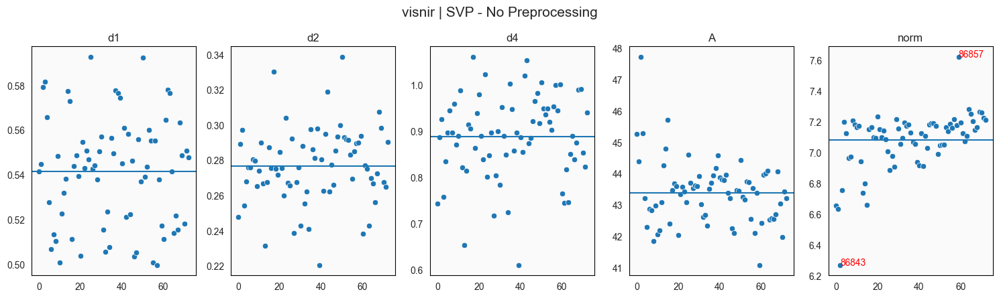

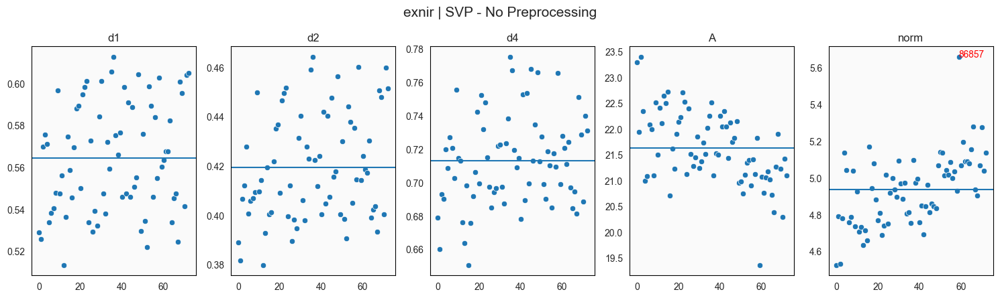

In [123]:
for spectrum in spectra:

    SAMPLE_TYPE = f'{label} | {spectrum}'
    raw_df = spectra[spectrum]
    plot_svp(raw_df, title=f'{spectrum} | SVP - No Preprocessing')

    raw_df_check = pd.DataFrame(raw_df)
    svp_arr = spectral_vector_properties(raw_df_check, True)

    #metrics cutoff
    metrics = {
        0 : 'd1',
        1 : 'd2',
        2 : 'd4',
        3 : 'A',
        4 : 'norm'
    }
    choice = 4
    maxval, minval = cutoff[spectrum]['maxval'], cutoff[spectrum]['minval']

    norm_data = svp_arr[metrics[choice]]
    norm_ax = plt.gcf().axes[choice]

    for idx in range(len(norm_data)):
        if norm_data.iloc[idx] < minval or norm_data.iloc[idx] > maxval:  
            norm_ax.text(idx, norm_data.iloc[idx], norm_data.index[idx], 
                        fontsize=10, color='red')

    plt.draw()

visnir


False    71
True      2
Name: norm, dtype: int64

exnir


False    72
True      1
Name: norm, dtype: int64

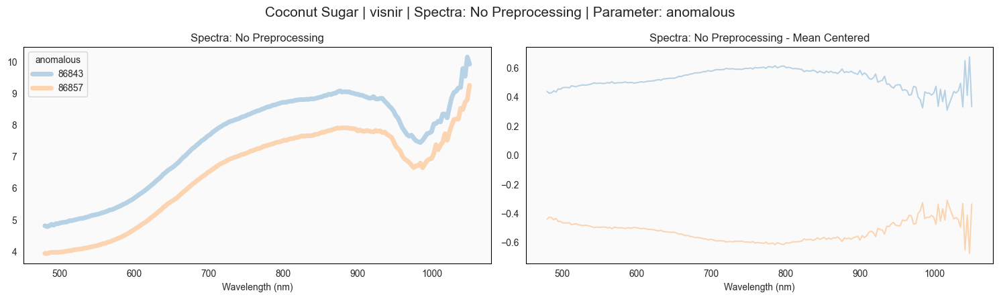

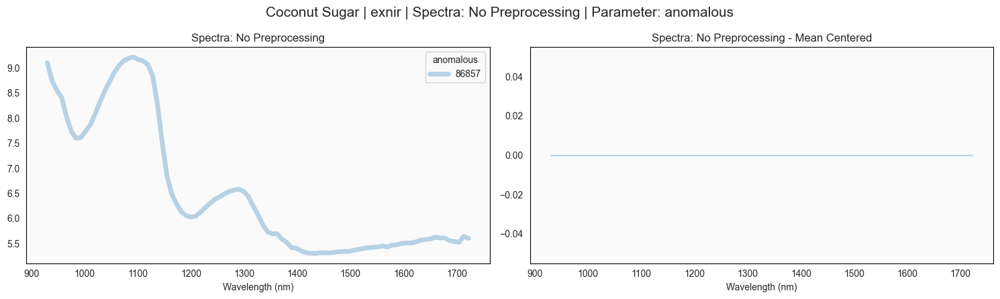

In [135]:
masks = {}
for spectrum in spectra:
    # if spectrum == 'visnir':
    #     continue
    print(spectrum)

    maxval, minval = cutoff[spectrum]['maxval'], cutoff[spectrum]['minval']

    SAMPLE_TYPE = f'{label} | {spectrum}'
    raw_df = spectra[spectrum]

    raw_df_check = pd.DataFrame(raw_df)
    svp_arr = spectral_vector_properties(raw_df_check, True)

    anomalous_mask = (svp_arr[metrics[choice]] < minval) | (svp_arr[metrics[choice]] > maxval)
    display(anomalous_mask.value_counts())
    masks ={
        **masks,
        spectrum:anomalous_mask
    }

    anomalous_df = svp_arr.loc[anomalous_mask,:]

    check_df = raw_df.loc[anomalous_mask,:]

    check_df = check_df.reset_index()

    check_df_labels = check_df[['lot_id']]
    check_df_labels['anomalous'] = check_df['lot_id']
    check_df_labels= check_df_labels.set_index('lot_id')

    check_df = check_df.set_index('lot_id')

    plot_spectra(check_df, labels=check_df_labels,
                spec_prep=PREPROCESSING,
                sample_type=SAMPLE_TYPE,
                cmap=cmap)

In [136]:
# anomalous_mask to remove
anomalous_mask = masks['exnir'] | masks['visnir']
anomalous_mask.value_counts()

False    71
True      2
Name: norm, dtype: int64

## filter outliers

In [174]:
cleaned_spectra = {}

for spectrum in spectra:

    maxval, minval = cutoff[spectrum]['maxval'], cutoff[spectrum]['minval']

    SAMPLE_TYPE = f'{label} | {spectrum}'
    raw_df = spectra[spectrum]

    # raw_df_check = pd.DataFrame(raw_df)
    # svp_arr = spectral_vector_properties(raw_df_check, True)

    # anomalous_mask = (svp_arr[metrics[choice]] < minval) | (svp_arr[metrics[choice]] > maxval)

    cleaned_df = raw_df.loc[~anomalous_mask,:]
    cleaned_labels = label_df.loc[~anomalous_mask,:]

    cleaned_spectra  = {
        **cleaned_spectra,
        f'{spectrum}_spectra': cleaned_df,
        f'{spectrum}_label': cleaned_labels
    }

raw_df_final = raw_df_og.set_index('lot_id').sort_index()
raw_df_final = raw_df_final.loc[~anomalous_mask,:]
label_df_final = label_df_og.set_index('lot_id').sort_index()
label_df_final = label_df_final.loc[~anomalous_mask,:]
label_df_final = label_df_final.drop_duplicates()

output_dir = Path(f"../data/processed/")
output_dir.mkdir(exist_ok=True, parents=True)
raw_df_final.to_csv(output_dir/f"cleaned_input.csv")
label_df_final.to_csv(output_dir/f"cleaned_label.csv")

print(cleaned_spectra.keys())

for key in cleaned_spectra.keys():
    print(key, cleaned_spectra[key].shape)  

dict_keys(['visnir_spectra', 'visnir_label', 'exnir_spectra', 'exnir_label'])
visnir_spectra (71, 191)
visnir_label (71, 6)
exnir_spectra (71, 89)
exnir_label (71, 6)


In [155]:
anomalous_mask

lot_id
86843    False
86843    False
86843     True
86843    False
86844    False
         ...  
86859    False
86860    False
86860    False
86860    False
86860    False
Name: norm, Length: 73, dtype: bool

In [166]:
for spectrum in spectra:

    maxval, minval = cutoff[spectrum]['maxval'], cutoff[spectrum]['minval']

    SAMPLE_TYPE = f'{label} | {spectrum}'
    raw_df = spectra[spectrum]

raw_df.index
# cleaned_df = raw_df.loc[~anomalous_mask,:]
# cleaned_df

Int64Index([86843, 86843, 86843, 86843, 86844, 86844, 86844, 86844, 86845,
            86845, 86845, 86845, 86846, 86846, 86846, 86846, 86847, 86847,
            86847, 86847, 86848, 86848, 86848, 86848, 86849, 86849, 86849,
            86849, 86849, 86850, 86850, 86850, 86850, 86851, 86851, 86851,
            86851, 86852, 86852, 86852, 86852, 86853, 86853, 86853, 86853,
            86854, 86854, 86854, 86854, 86855, 86855, 86855, 86855, 86856,
            86856, 86856, 86856, 86857, 86857, 86857, 86857, 86858, 86858,
            86858, 86858, 86859, 86859, 86859, 86859, 86860, 86860, 86860,
            86860],
           dtype='int64', name='lot_id')

Assigned visnir_spectra to spectra_df
Assigned visnir_label to label_df


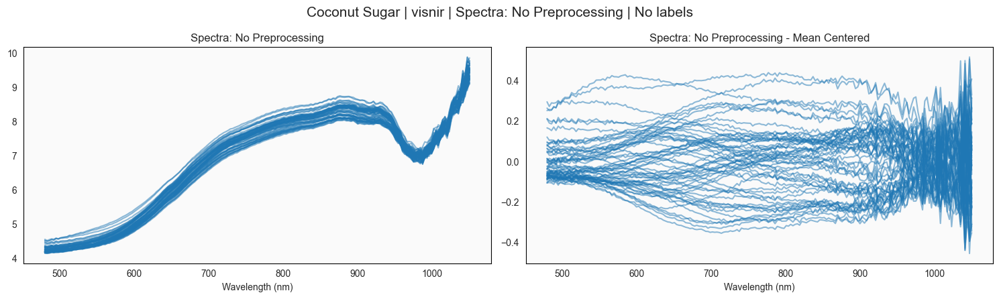

Assigned exnir_spectra to spectra_df
Assigned exnir_label to label_df


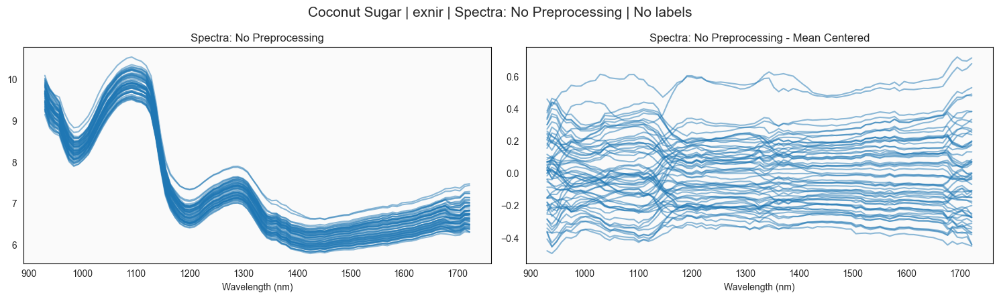

In [62]:
data_split = ['spectra', 'label']
PREPROCESSING = 'No Preprocessing'

output_dir = Path(f"../data/visualization/")
output_dir.mkdir(exist_ok=True, parents=True)

for spectrum in spectra:

    for split in data_split:
        key = f'{spectrum}_{split}'
        if key in cleaned_spectra:
            if split == 'spectra':
                selected_df = cleaned_spectra[key]
            elif split == 'label':
                selected_labels = cleaned_spectra[key]
            print(f'Assigned {key} to {split}_df')
    
    SAMPLE_TYPE = f'{label} | {spectrum}'

    plot_spectra(selected_df, labels=None,
                spec_prep=PREPROCESSING,
                sample_type=SAMPLE_TYPE,
                cmap=cmap);

    plt.savefig(output_dir/f'spectra_{spectrum}_noLabel', bbox_inches='tight')
    plt.show()
    plt.close()

# No Preprocessing

In [89]:
data_split = ['spectra', 'label']
spectra_meta = {}
PREPROCESSING = 'No Preprocessing'
output_dir = Path(f"../data/visualization/{PREPROCESSING}")
output_dir.mkdir(exist_ok=True, parents=True)

In [90]:
for spectrum in spectra:

    for split in data_split:
        key = f'{spectrum}_{split}'
        if key in cleaned_spectra:
            if split == 'spectra':
                selected_df = cleaned_spectra[key]
            elif split == 'label':
                selected_labels = cleaned_spectra[key]
            print(f'Assigned {key} to {split}_df')
    
    SAMPLE_TYPE = f'{label} | {spectrum}'

    plot_df = selected_df.copy()

    spectra_meta = {
        **spectra_meta,
        f'{spectrum}_plot_df' : plot_df
    }
    
    for param, label_type in param_label_map.items():
        plot_spectra(plot_df, labels=selected_labels[[param]],
                    label_type=label_type,
                    spec_prep=PREPROCESSING,
                    sample_type=SAMPLE_TYPE,
                    cmap=cmap)
        plt.savefig(output_dir/f'spectra_{spectrum}_{param}', bbox_inches='tight')
        plt.close()


Assigned visnir_spectra to spectra_df
Assigned visnir_label to label_df
Assigned exnir_spectra to spectra_df
Assigned exnir_label to label_df


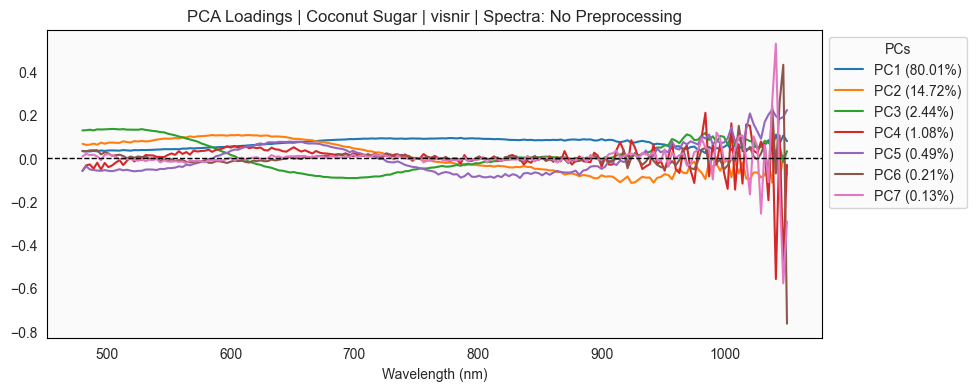

Total Explained Variance: 99.075% 
    Number of Components: 7


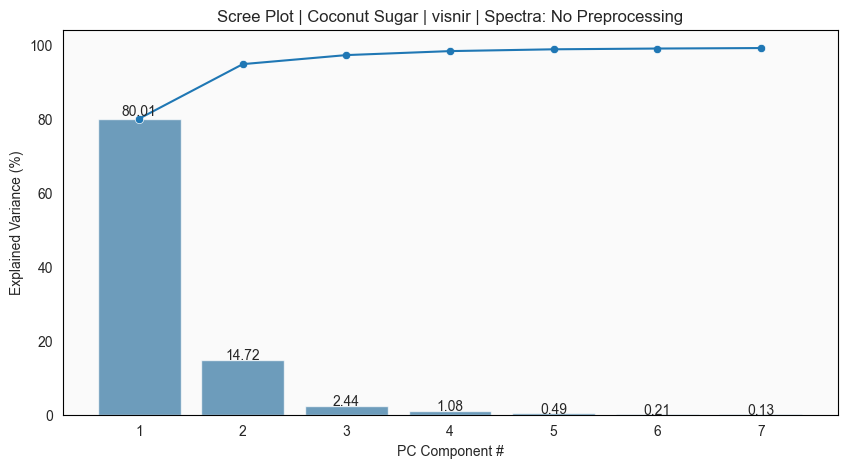

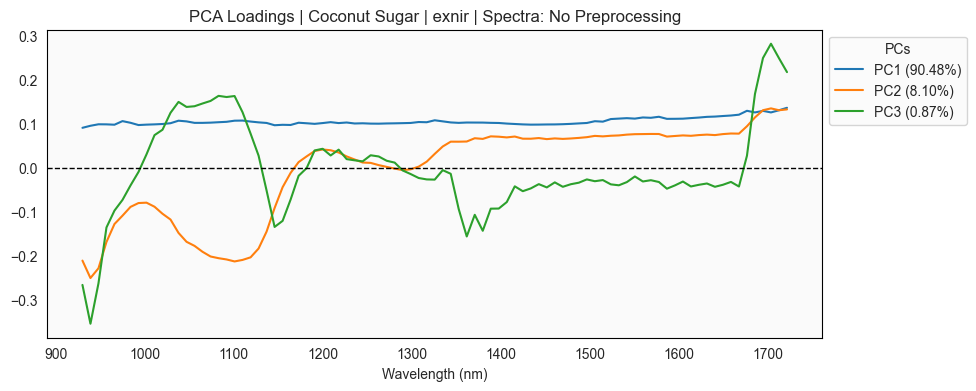

Total Explained Variance: 99.449% 
    Number of Components: 3


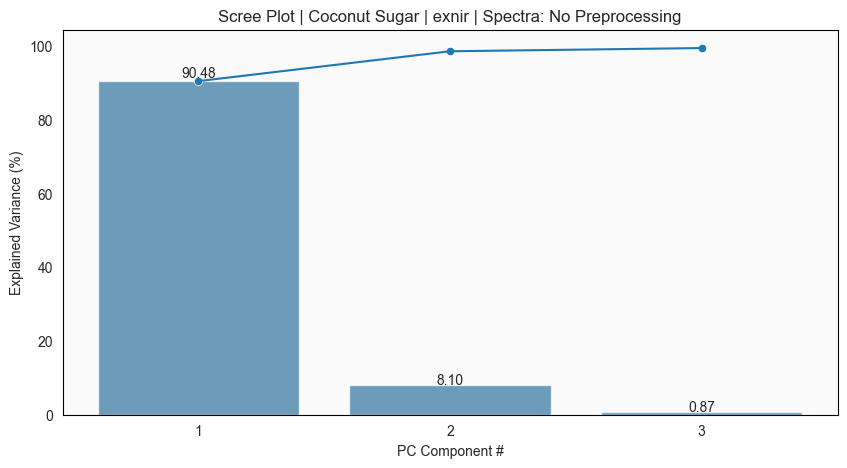

In [91]:
N_COMP = 0.99
RANDOM_STATE = 42
for spectrum in spectra:
    SAMPLE_TYPE = f'{label} | {spectrum}'
    plot_df = spectra_meta[f'{spectrum}_plot_df']

    fitted_pc, pc_labels = fit_pca(plot_df, N_COMP, RANDOM_STATE)

    spectra_meta = {
            **spectra_meta,
            f'{spectrum}_fitted_pc' : fitted_pc,
            f'{spectrum}_pc_labels' : pc_labels,
            }

    fig2, ax2 = plot_loadings(plot_df, fitted_pc, pc_labels, 
                            spec_prep=PREPROCESSING, 
                            sample_type=SAMPLE_TYPE)
    
    plt.savefig(output_dir/f'pca_loadings_{spectrum}', bbox_inches='tight')
    plt.show()
    plt.close()
    

    fig1, ax1 = plot_scree(fitted_pc,
                        spec_prep=PREPROCESSING, 
                        sample_type=SAMPLE_TYPE)    

    print(f"""Total Explained Variance: {fitted_pc.explained_variance_ratio_.sum()*100:.3f}% 
    Number of Components: {len(fitted_pc.explained_variance_ratio_)}""")

    plt.savefig(output_dir/f'scree_{spectrum}', bbox_inches='tight')
    plt.show()
    plt.close()

Assigned visnir_spectra to spectra_df
Assigned visnir_label to label_df


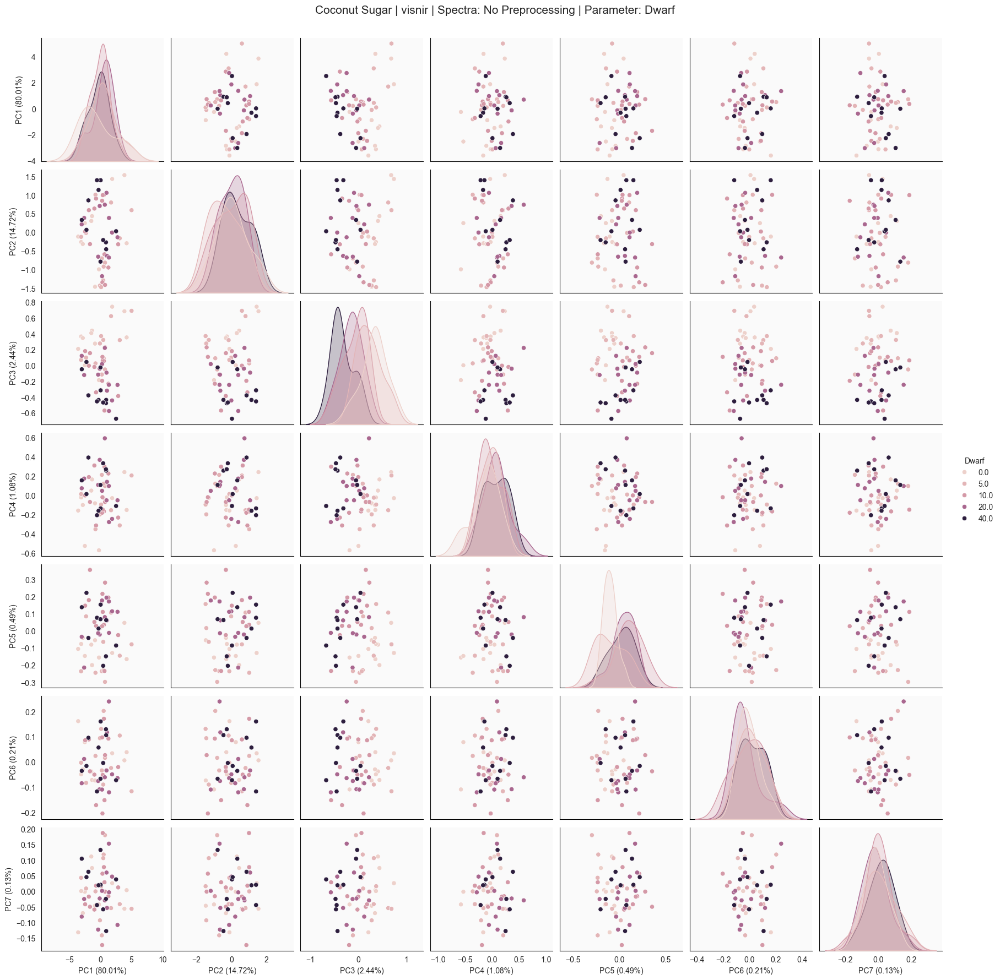

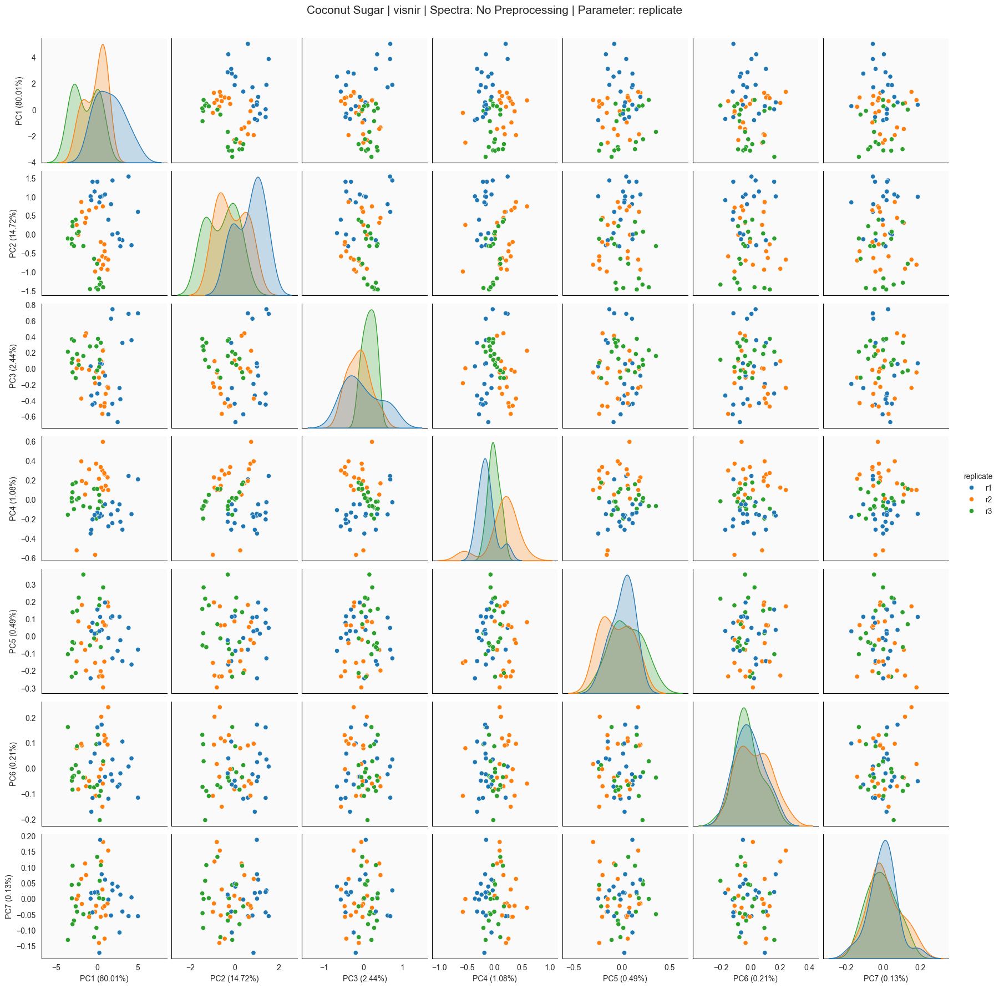

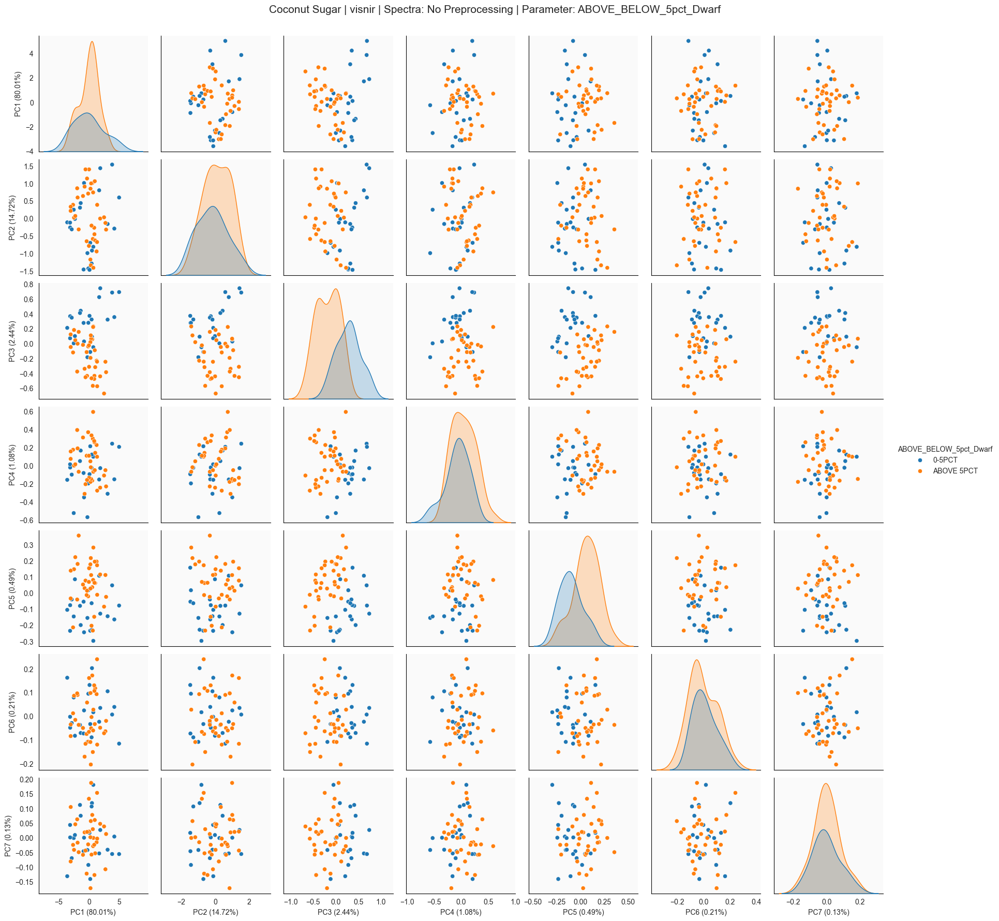

Assigned exnir_spectra to spectra_df
Assigned exnir_label to label_df


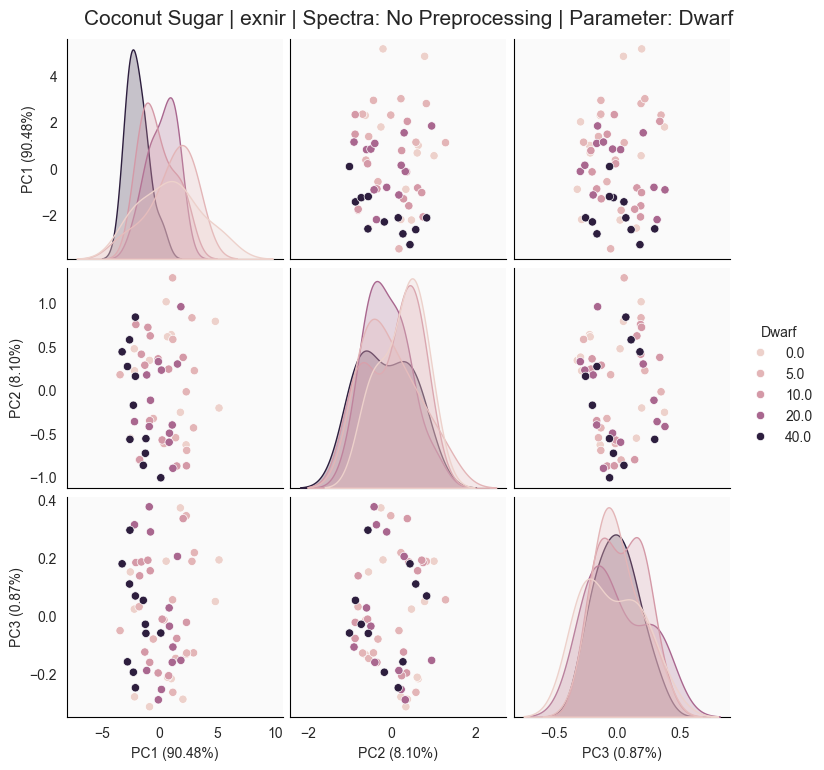

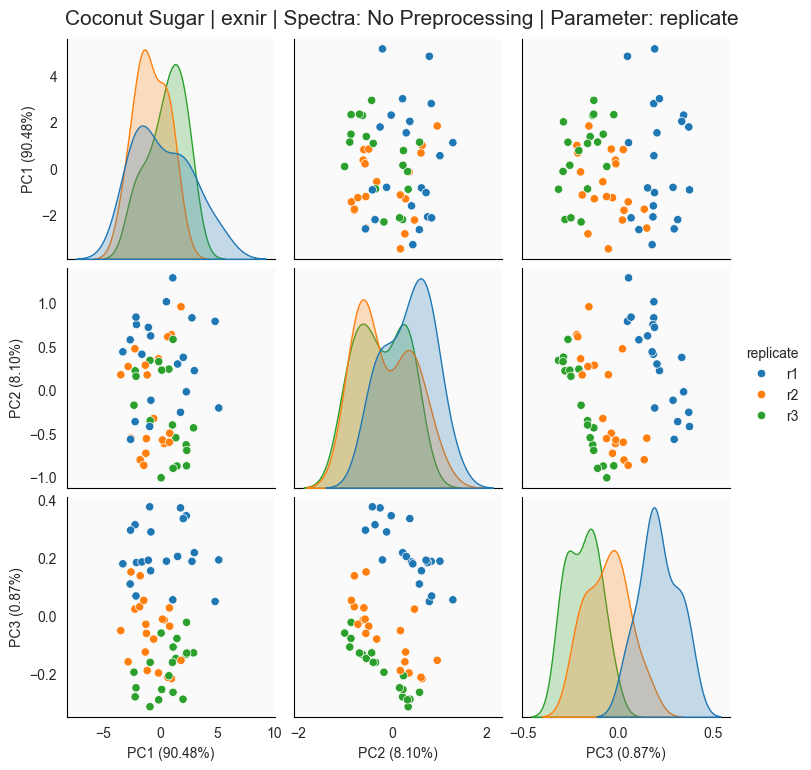

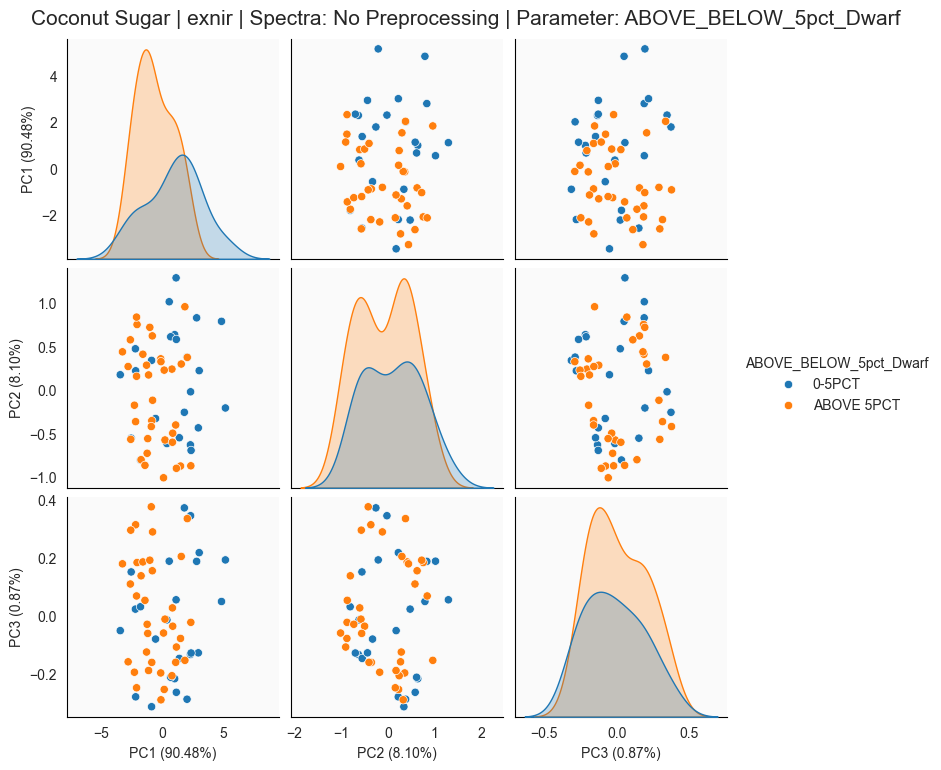

In [92]:
for spectrum in spectra:
    SAMPLE_TYPE = f'{label} | {spectrum}'

    for split in data_split:
        key = f'{spectrum}_{split}'
        if key in cleaned_spectra:
            if split == 'spectra':
                selected_df = cleaned_spectra[key]
            elif split == 'label':
                selected_labels = cleaned_spectra[key]
            print(f'Assigned {key} to {split}_df')
    
    plot_df = spectra_meta[f'{spectrum}_plot_df']
    fitted_pc = spectra_meta[f'{spectrum}_fitted_pc']
    pc_labels = spectra_meta[f'{spectrum}_pc_labels']

    for param in param_label_map.keys():
        pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=selected_labels[[param]])
        sns.pairplot(data=pc_df.reset_index().drop('lot_id', axis=1), hue=param)
        plt.suptitle(f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING} | Parameter: {param}', y=1.02, size=15)
        plt.savefig(output_dir/f'pca_{spectrum}_{param}', bbox_inches='tight')
        plt.show()
        plt.close()

In [93]:
# fig = make_subplots(rows=3, cols= 2, 
#                     subplot_titles=['F Test Spectra', 'F Test PCA', 
#                                     'Mutual Info Spectra', 'Mutual Info PCA',
#                                     'Chi2 Spectra', 'Chi2 PCA'],
#                     specs=[[{'secondary_y': True}, {'secondary_y': True}],
#                            [{'secondary_y': False}, {'secondary_y': False}],
#                            [{'secondary_y': True}, {'secondary_y': True}]],
#                     horizontal_spacing=0.15,
#                     vertical_spacing=0.1)

# title = f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING}'
# colors = px.colors.qualitative.Plotly
# pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df)
# n_comp = fitted_pc.n_components_

# for i, param in enumerate(param_label_map.keys()):
#     try:
#         f_reg_spec = f_classif(plot_df, label_df[param].values.ravel())
#         f_reg_pca = f_classif(pc_df.iloc[:, :n_comp], pc_df[param].values.ravel())
#         mms = MinMaxScaler()
#         scaled_spec = mms.fit_transform(plot_df)
#         scaled_pca = mms.fit_transform(pc_df.iloc[:, :n_comp])
#         mi_spec = mutual_info_classif(scaled_spec, label_df[param].values.ravel())
#         mi_pca = mutual_info_classif(scaled_pca, pc_df[param].values.ravel())
#         chi2_spec = chi2(scaled_spec, label_df[param].values.ravel())
#         chi2_pca = chi2(scaled_pca, pc_df[param].values.ravel())
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=mi_spec, marker_color=colors[i], name=param,
#                        opacity=0.8, showlegend=False),
#                        secondary_y=False,row=2, col=1)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=mi_pca, name=param, marker_color=colors[i],
#                        showlegend=False, opacity=0.8),
#                     secondary_y=False, row=2, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=2)
        
#     except:
#         pass

# # Add figure title
# fig.update_layout(title_text=title, height=1400, width=1400)
# fig.update_xaxes(title_text="Wavelengths (nm)", col=1)
# fig.update_xaxes(title_text="No. of PCs", col=2)

# # Set y-axes titles
# fig.update_yaxes(title_text="F value", secondary_y=False, row=1)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=1)
# fig.update_yaxes(title_text="Mutual Information", secondary_y=False, row=2)
# fig.update_yaxes(title_text="Chi2", secondary_y=False, row=3)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=3)

# fig.show()

# SNV

In [94]:
data_split = ['spectra', 'label']
spectra_meta = {}

PREPROCESSING = 'SNV'
output_dir = Path(f"../data/visualization/{PREPROCESSING}")
output_dir.mkdir(exist_ok=True, parents=True)

In [95]:
for spectrum in spectra:

    for split in data_split:
        key = f'{spectrum}_{split}'
        if key in cleaned_spectra:
            if split == 'spectra':
                selected_df = cleaned_spectra[key]
            elif split == 'label':
                selected_labels = cleaned_spectra[key]
            print(f'Assigned {key} to {split}_df')
    
    SAMPLE_TYPE = f'{label} | {spectrum}'

    # CONFIGS
    snv_df = pd.DataFrame(SNV().fit_transform(selected_df), columns=selected_df.columns, index=selected_df.index)
    plot_df = snv_df.copy()

    spectra_meta = {
        **spectra_meta,
        f'{spectrum}_plot_df' : plot_df
    }
    
    for param, label_type in param_label_map.items():
        plot_spectra(plot_df, labels=selected_labels[[param]],
                    label_type=label_type,
                    spec_prep=PREPROCESSING,
                    sample_type=SAMPLE_TYPE,
                    cmap=cmap)
        plt.savefig(output_dir/f'spectra_{spectrum}_{param}', bbox_inches='tight')
        plt.close()

Assigned visnir_spectra to spectra_df
Assigned visnir_label to label_df
Assigned exnir_spectra to spectra_df
Assigned exnir_label to label_df


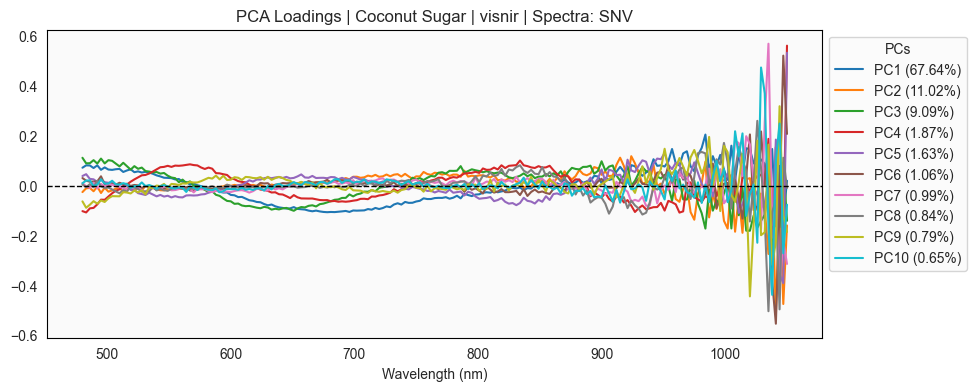

Total Explained Variance: 95.570% 
    Number of Components: 10


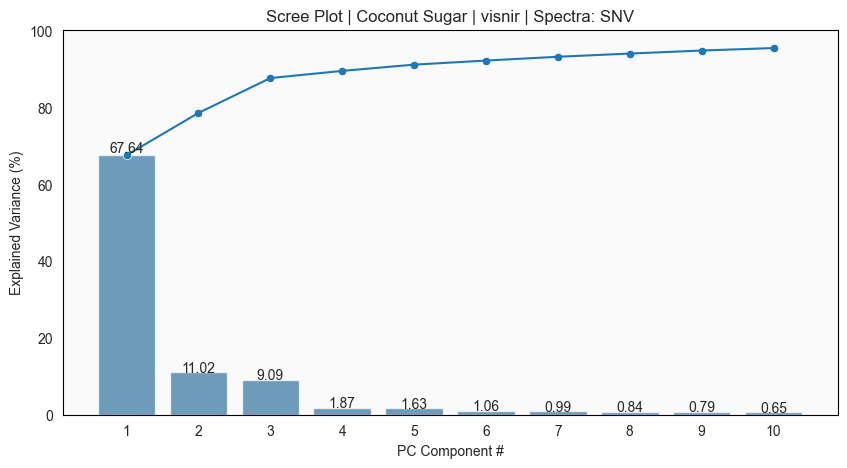

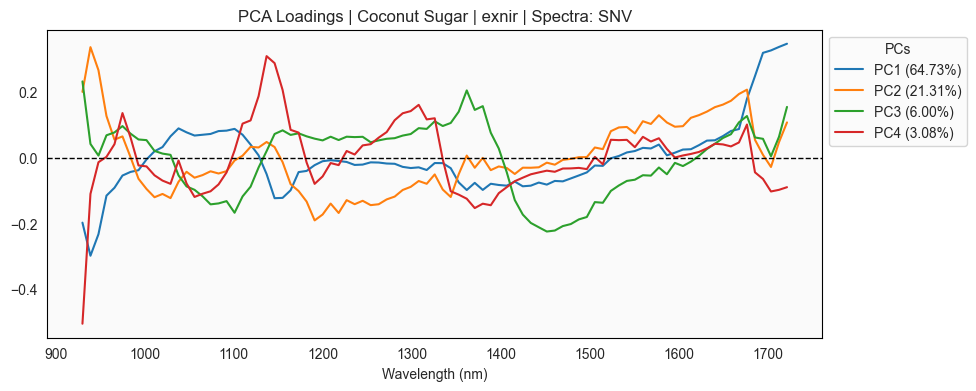

Total Explained Variance: 95.114% 
    Number of Components: 4


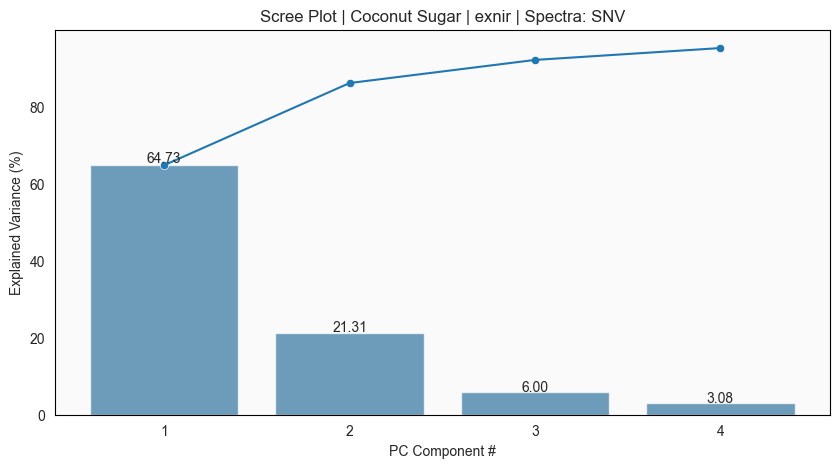

In [96]:
N_COMP = 0.95
RANDOM_STATE = 42
for spectrum in spectra:
    SAMPLE_TYPE = f'{label} | {spectrum}'
    plot_df = spectra_meta[f'{spectrum}_plot_df']

    fitted_pc, pc_labels = fit_pca(plot_df, N_COMP, RANDOM_STATE)

    spectra_meta = {
            **spectra_meta,
            f'{spectrum}_fitted_pc' : fitted_pc,
            f'{spectrum}_pc_labels' : pc_labels,
            }

    fig2, ax2 = plot_loadings(plot_df, fitted_pc, pc_labels, 
                            spec_prep=PREPROCESSING, 
                            sample_type=SAMPLE_TYPE)
    
    plt.savefig(output_dir/f'pca_loadings_{spectrum}', bbox_inches='tight')
    plt.show()
    plt.close()
    

    fig1, ax1 = plot_scree(fitted_pc,
                        spec_prep=PREPROCESSING, 
                        sample_type=SAMPLE_TYPE)    

    print(f"""Total Explained Variance: {fitted_pc.explained_variance_ratio_.sum()*100:.3f}% 
    Number of Components: {len(fitted_pc.explained_variance_ratio_)}""")

    plt.savefig(output_dir/f'scree_{spectrum}', bbox_inches='tight')
    plt.show()
    plt.close()

Assigned visnir_spectra to spectra_df
Assigned visnir_label to label_df


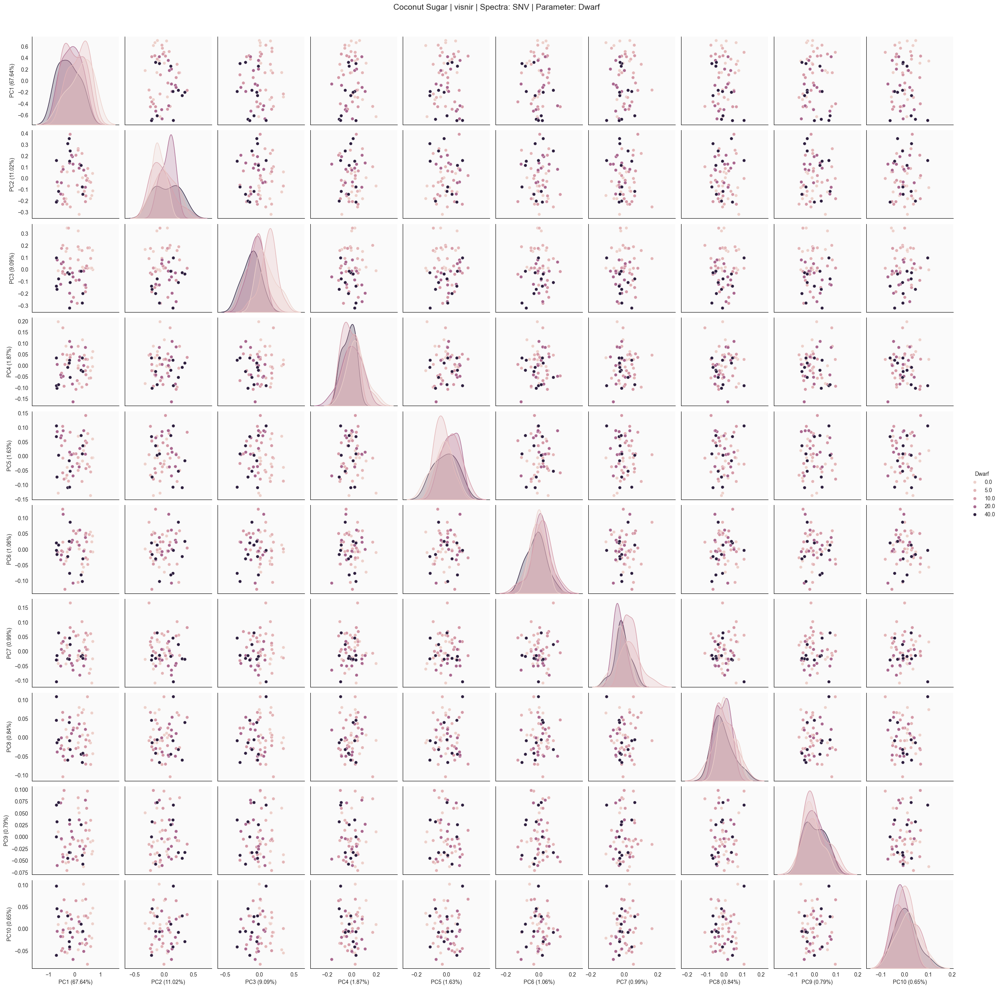

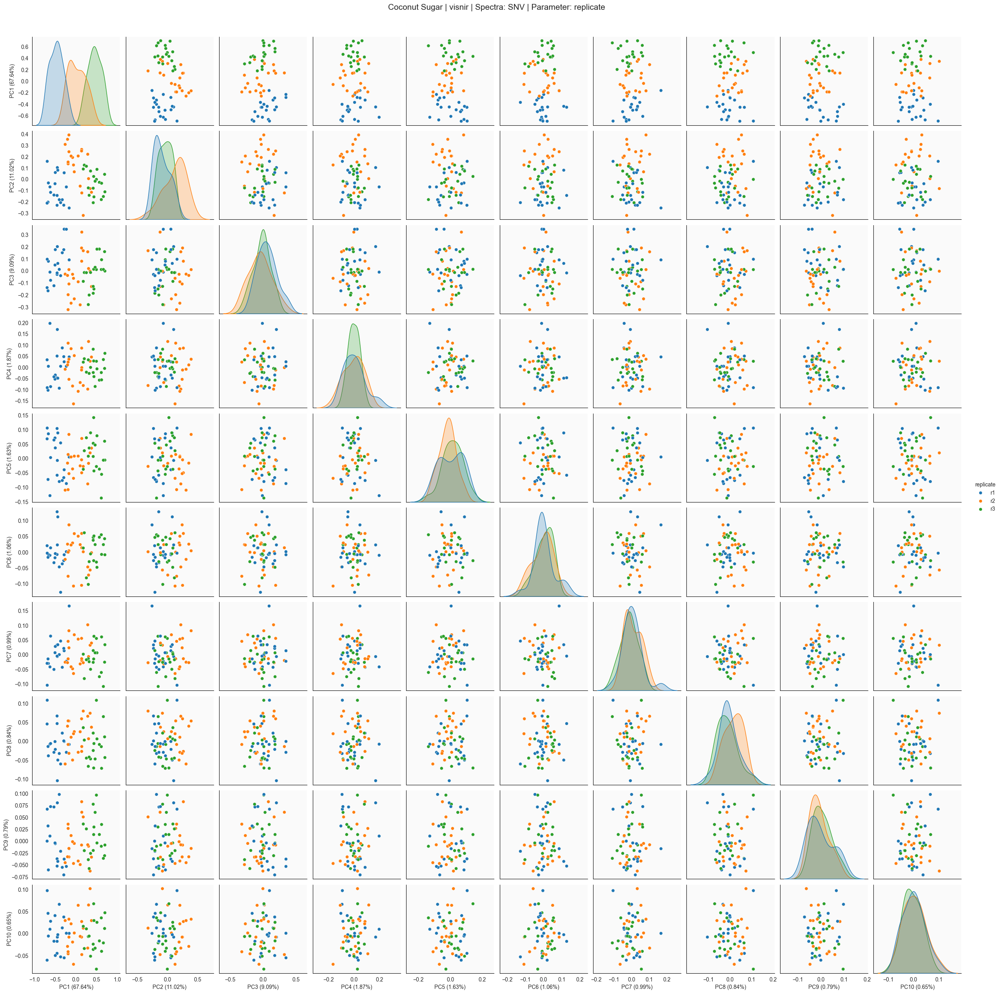

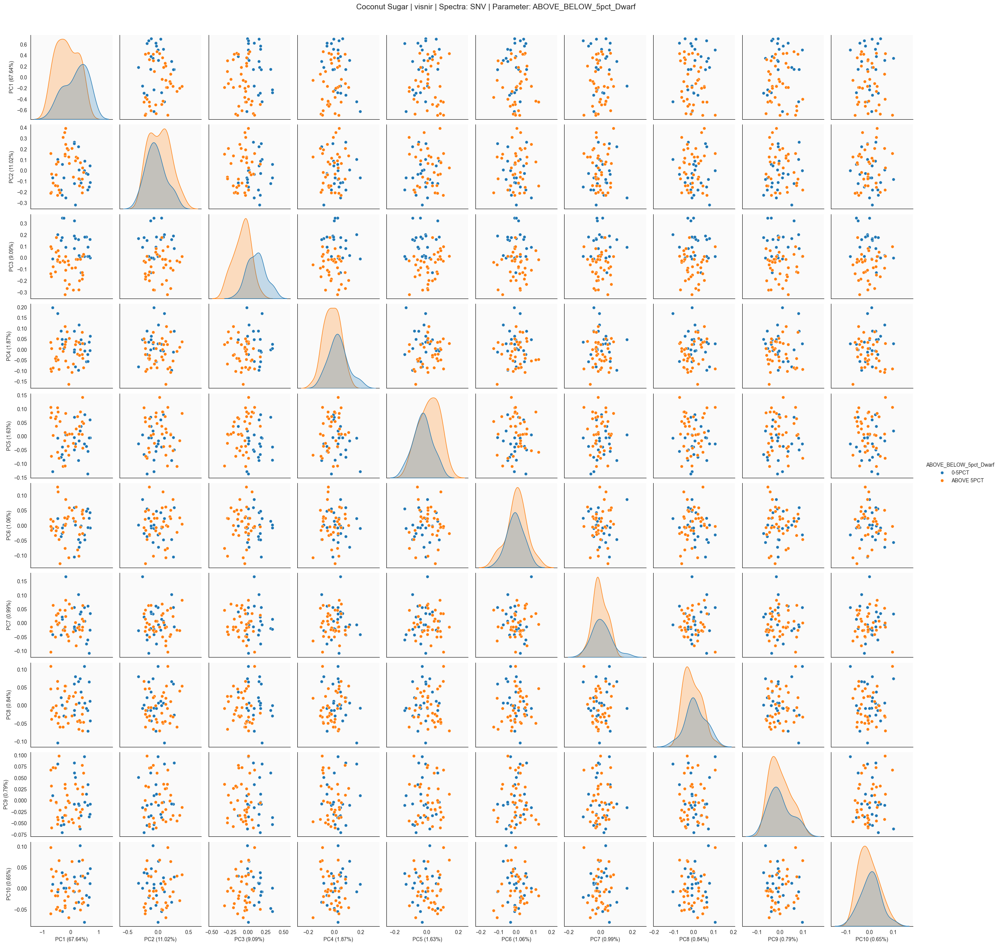

Assigned exnir_spectra to spectra_df
Assigned exnir_label to label_df


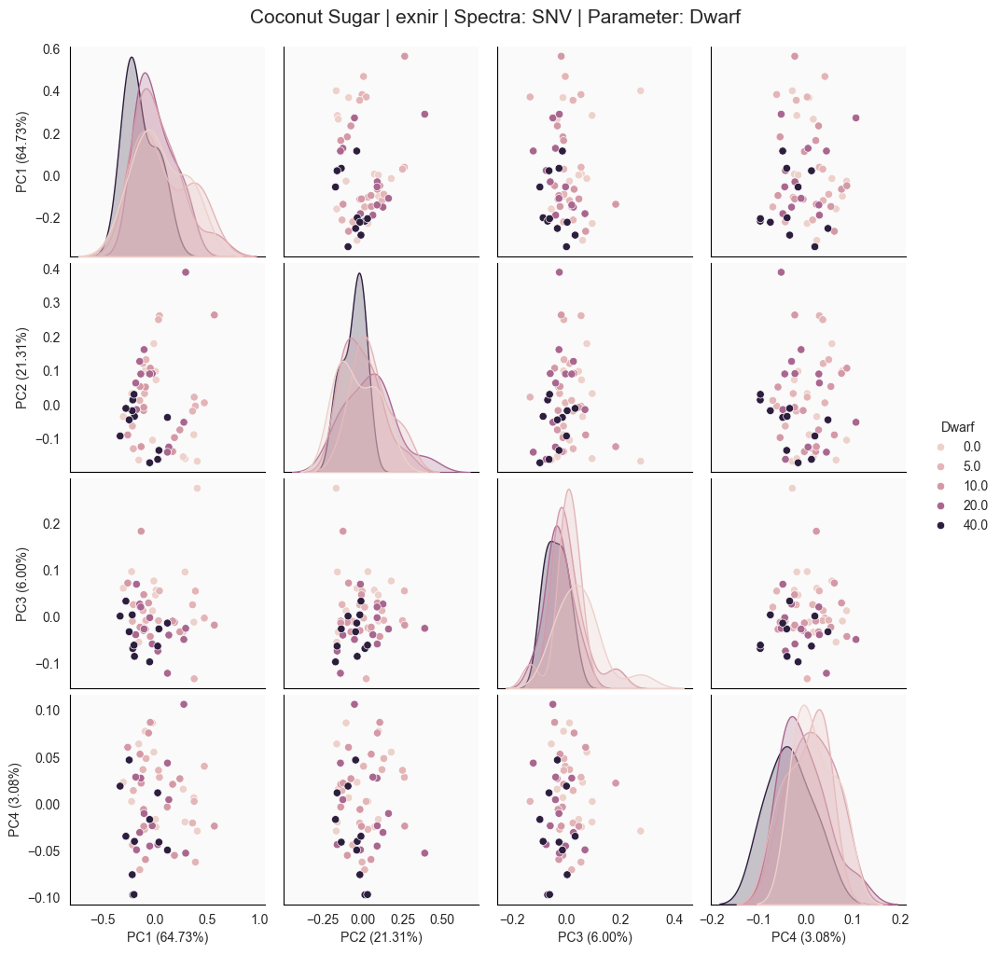

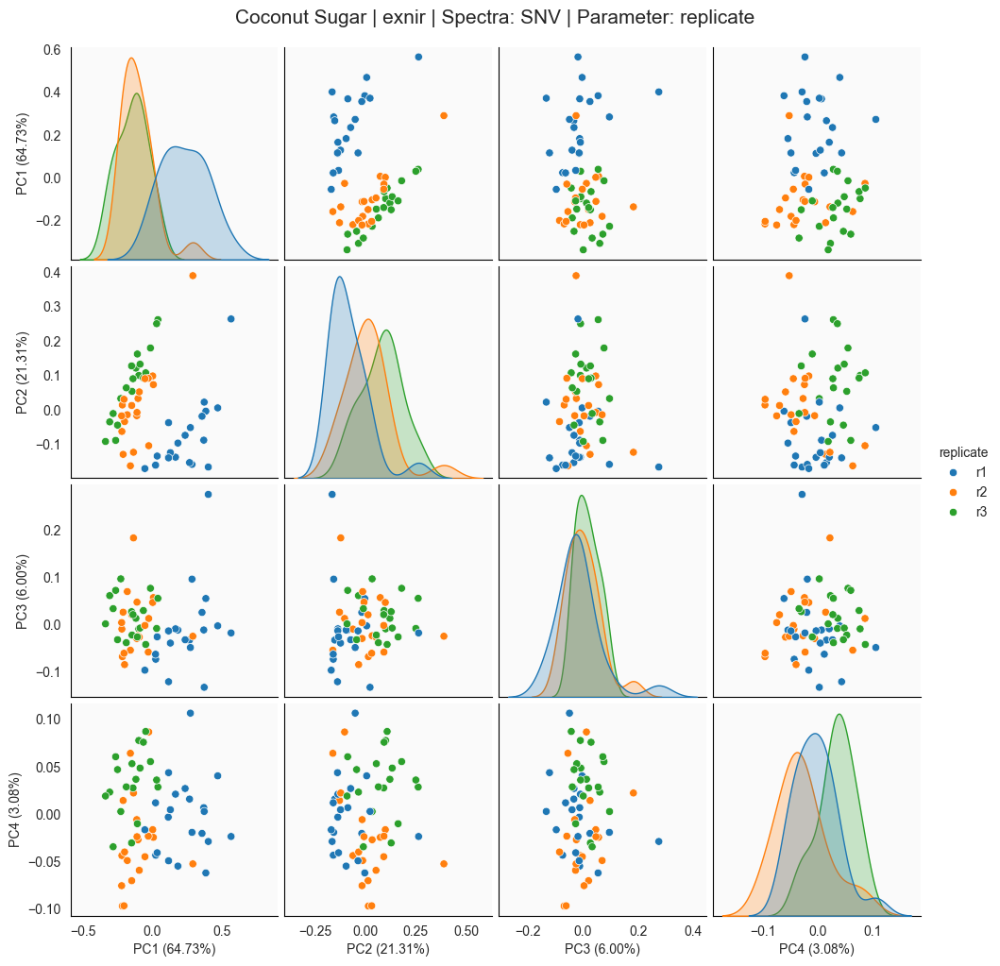

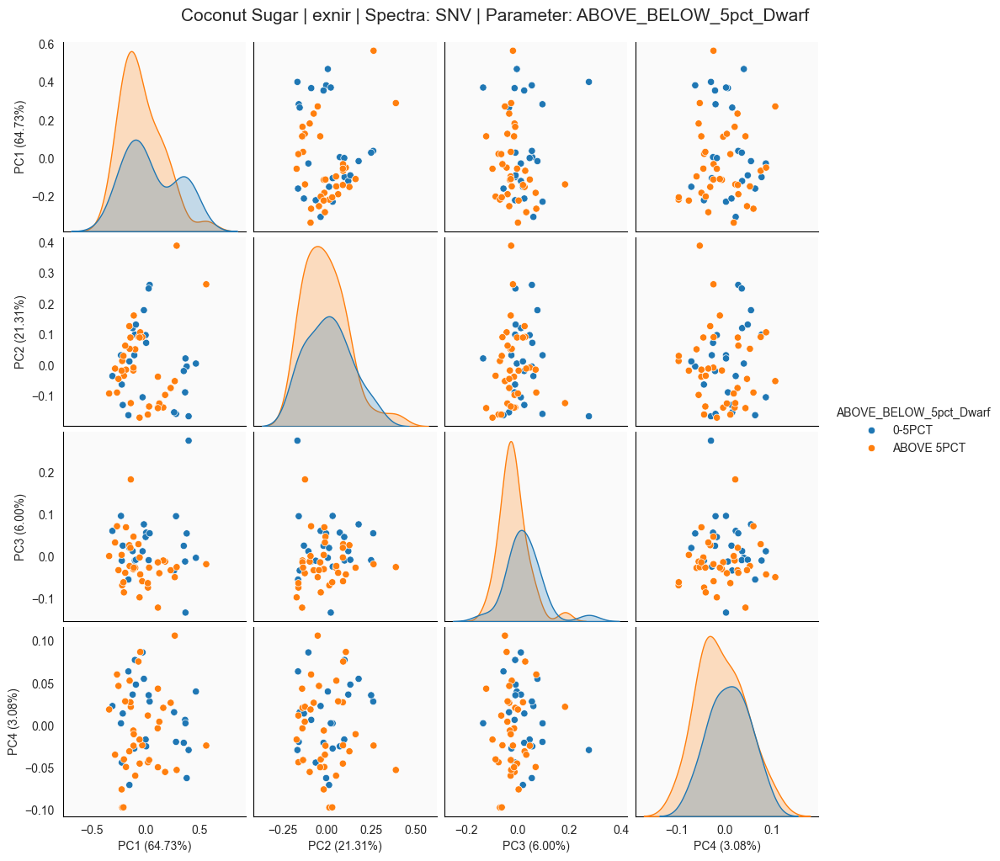

In [97]:
for spectrum in spectra:
    SAMPLE_TYPE = f'{label} | {spectrum}'

    for split in data_split:
        key = f'{spectrum}_{split}'
        if key in cleaned_spectra:
            if split == 'spectra':
                selected_df = cleaned_spectra[key]
            elif split == 'label':
                selected_labels = cleaned_spectra[key]
            print(f'Assigned {key} to {split}_df')
    
    plot_df = spectra_meta[f'{spectrum}_plot_df']
    fitted_pc = spectra_meta[f'{spectrum}_fitted_pc']
    pc_labels = spectra_meta[f'{spectrum}_pc_labels']

    for param in param_label_map.keys():
        pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=selected_labels[[param]])
        sns.pairplot(data=pc_df.reset_index().drop('lot_id', axis=1), hue=param)
        plt.suptitle(f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING} | Parameter: {param}', y=1.02, size=15)
        plt.savefig(output_dir/f'pca_{spectrum}_{param}', bbox_inches='tight')
        plt.show()
        plt.close()

In [98]:
# from adjustText import adjust_text

# N_COMP = 0.96
# RANDOM_STATE = 42

# fitted_pc, pc_labels = fit_pca(plot_df, N_COMP, RANDOM_STATE)

# for param in param_label_map.keys():
#     pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df[[param]])
#     g = sns.pairplot(data=pc_df.reset_index().drop('lot_id', axis=1), hue=param, height=5)

#     # Set to track which indices have been labeled
#     labeled_indices = set()
#     label_all = 'yes'

#     # Add data labels (annotations)
#     for i, j in zip(*np.tril_indices_from(g.axes, -1)):  # Iterate over the lower triangular part of the plot matrix
#         ax = g.axes[i, j]  # Access each subplot
#         xlabel = g.x_vars[j]  # Get the variable name for the x-axis
#         ylabel = g.y_vars[i]  # Get the variable name for the y-axis
        
#         for k in range(pc_df.shape[0]):  # Iterate through the rows of the dataframe
#             index_label = pc_df.index[k]  # Get the index label
#             if label_all == 'yes' and index_label in (80079,80069,80059,80061): #80064,80060
#                 ax.annotate(index_label, (pc_df.iloc[k][xlabel], pc_df.iloc[k][ylabel]), fontsize=7, ha='left')
#             # else:
#             #     if index_label not in labeled_indices:  # Check if the index has already been labeled
#             #         ax.annotate(index_label, (pc_df.iloc[k][xlabel], pc_df.iloc[k][ylabel]), fontsize=8, ha='left')
#             #         labeled_indices.add(index_label)  # Mark this index as labeled            

#     plt.suptitle(f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING} | Parameter: {param}', y=1.02, size=15)
#     plt.show()

In [99]:
# fig = make_subplots(rows=3, cols= 2, 
#                     subplot_titles=['F Test Spectra', 'F Test PCA', 
#                                     'Mutual Info Spectra', 'Mutual Info PCA',
#                                     'Chi2 Spectra', 'Chi2 PCA'],
#                     specs=[[{'secondary_y': True}, {'secondary_y': True}],
#                            [{'secondary_y': False}, {'secondary_y': False}],
#                            [{'secondary_y': True}, {'secondary_y': True}]],
#                     horizontal_spacing=0.15,
#                     vertical_spacing=0.1)

# title = f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING}'
# colors = px.colors.qualitative.Plotly
# pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df)
# n_comp = fitted_pc.n_components_

# for i, param in enumerate(param_label_map.keys()):
#     try:
#         f_reg_spec = f_classif(plot_df, label_df[param].values.ravel())
#         f_reg_pca = f_classif(pc_df.iloc[:, :n_comp], pc_df[param].values.ravel())
#         mms = MinMaxScaler()
#         scaled_spec = mms.fit_transform(plot_df)
#         scaled_pca = mms.fit_transform(pc_df.iloc[:, :n_comp])
#         mi_spec = mutual_info_classif(scaled_spec, label_df[param].values.ravel())
#         mi_pca = mutual_info_classif(scaled_pca, pc_df[param].values.ravel())
#         chi2_spec = chi2(scaled_spec, label_df[param].values.ravel())
#         chi2_pca = chi2(scaled_pca, pc_df[param].values.ravel())
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=mi_spec, marker_color=colors[i], name=param,
#                        opacity=0.8, showlegend=False),
#                        secondary_y=False,row=2, col=1)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=mi_pca, name=param, marker_color=colors[i],
#                        showlegend=False, opacity=0.8),
#                     secondary_y=False, row=2, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=2)
        
#     except:
#         pass

# # Add figure title
# fig.update_layout(title_text=title, height=1400, width=1400)
# fig.update_xaxes(title_text="Wavelengths (nm)", col=1)
# fig.update_xaxes(title_text="No. of PCs", col=2)

# # Set y-axes titles
# fig.update_yaxes(title_text="F value", secondary_y=False, row=1)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=1)
# fig.update_yaxes(title_text="Mutual Information", secondary_y=False, row=2)
# fig.update_yaxes(title_text="Chi2", secondary_y=False, row=3)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=3)

# fig.show()

# Detrend

In [23]:
# # CONFIGS
# msc = Detrend()
# msc_df = pd.DataFrame(msc.fit_transform(raw_df), columns=raw_df.columns, index=raw_df.index)
# plot_df = msc_df.copy()
# PREPROCESSING = 'Detrend'

In [24]:
# for param, label_type in param_label_map.items():
#     plot_spectra(plot_df, labels=label_df[[param]],
#                  label_type=label_type,
#                  spec_prep=PREPROCESSING,
#                  sample_type=SAMPLE_TYPE,
#                  cmap=cmap)

In [25]:
# N_COMP = 0.99
# RANDOM_STATE = 42

# fitted_pc, pc_labels = fit_pca(plot_df, N_COMP, RANDOM_STATE)
# fig2, ax2 = plot_loadings(plot_df, fitted_pc, pc_labels, 
#                           spec_prep=PREPROCESSING, 
#                           sample_type=SAMPLE_TYPE)
# fig1, ax1 = plot_scree(fitted_pc,
#                        spec_prep=PREPROCESSING, 
#                        sample_type=SAMPLE_TYPE)
# print(f"""Total Explained Variance: {fitted_pc.explained_variance_ratio_.sum()*100:.3f}% 
# Number of Components: {len(fitted_pc.explained_variance_ratio_)}""")

In [26]:
# for param in param_label_map.keys():
#     pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df[[param]])
#     sns.pairplot(data=pc_df.reset_index().drop('lot_id', axis=1), hue=param)
#     plt.suptitle(f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING} | Parameter: {param}', y=1.02, size=15)

In [27]:
# fig = make_subplots(rows=3, cols= 2, 
#                     subplot_titles=['F Test Spectra', 'F Test PCA', 
#                                     'Mutual Info Spectra', 'Mutual Info PCA',
#                                     'Chi2 Spectra', 'Chi2 PCA'],
#                     specs=[[{'secondary_y': True}, {'secondary_y': True}],
#                            [{'secondary_y': False}, {'secondary_y': False}],
#                            [{'secondary_y': True}, {'secondary_y': True}]],
#                     horizontal_spacing=0.15,
#                     vertical_spacing=0.1)

# title = f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING}'
# colors = px.colors.qualitative.Plotly
# pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df)
# n_comp = fitted_pc.n_components_

# for i, param in enumerate(param_label_map.keys()):
#     try:
#         f_reg_spec = f_classif(plot_df, label_df[param].values.ravel())
#         f_reg_pca = f_classif(pc_df.iloc[:, :n_comp], pc_df[param].values.ravel())
#         mms = MinMaxScaler()
#         scaled_spec = mms.fit_transform(plot_df)
#         scaled_pca = mms.fit_transform(pc_df.iloc[:, :n_comp])
#         mi_spec = mutual_info_classif(scaled_spec, label_df[param].values.ravel())
#         mi_pca = mutual_info_classif(scaled_pca, pc_df[param].values.ravel())
#         chi2_spec = chi2(scaled_spec, label_df[param].values.ravel())
#         chi2_pca = chi2(scaled_pca, pc_df[param].values.ravel())
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=mi_spec, marker_color=colors[i], name=param,
#                        opacity=0.8, showlegend=False),
#                        secondary_y=False,row=2, col=1)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=mi_pca, name=param, marker_color=colors[i],
#                        showlegend=False, opacity=0.8),
#                     secondary_y=False, row=2, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=2)
        
#     except:
#         pass

# # Add figure title
# fig.update_layout(title_text=title, height=1400, width=1400)
# fig.update_xaxes(title_text="Wavelengths (nm)", col=1)
# fig.update_xaxes(title_text="No. of PCs", col=2)

# # Set y-axes titles
# fig.update_yaxes(title_text="F value", secondary_y=False, row=1)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=1)
# fig.update_yaxes(title_text="Mutual Information", secondary_y=False, row=2)
# fig.update_yaxes(title_text="Chi2", secondary_y=False, row=3)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=3)

# fig.show()

# SNV-Detrend

In [28]:
# # CONFIGS
# snv_df = pd.DataFrame(Detrend().fit_transform(SNV().fit_transform(raw_df)), columns=raw_df.columns, index=raw_df.index)
# plot_df = snv_df.copy()
# PREPROCESSING = 'SNV-Detrend'

In [29]:
# for param, label_type in param_label_map.items():
#     plot_spectra(plot_df, labels=label_df[[param]],
#                  label_type=label_type,
#                  spec_prep=PREPROCESSING,
#                  sample_type=SAMPLE_TYPE,
#                  cmap=cmap)

In [30]:
# N_COMP = 0.99
# RANDOM_STATE = 42

# fitted_pc, pc_labels = fit_pca(plot_df, N_COMP, RANDOM_STATE)
# fig2, ax2 = plot_loadings(plot_df, fitted_pc, pc_labels, 
#                           spec_prep=PREPROCESSING, 
#                           sample_type=SAMPLE_TYPE)
# fig1, ax1 = plot_scree(fitted_pc,
#                        spec_prep=PREPROCESSING, 
#                        sample_type=SAMPLE_TYPE)
# print(f"""Total Explained Variance: {fitted_pc.explained_variance_ratio_.sum()*100:.3f}% 
# Number of Components: {len(fitted_pc.explained_variance_ratio_)}""")

In [31]:
# for param in param_label_map.keys():
#     pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df[[param]])
#     sns.pairplot(data=pc_df.reset_index().drop('lot_id', axis=1), hue=param)
#     plt.suptitle(f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING} | Parameter: {param}', y=1.02, size=15)

In [32]:
# fig = make_subplots(rows=3, cols= 2, 
#                     subplot_titles=['F Test Spectra', 'F Test PCA', 
#                                     'Mutual Info Spectra', 'Mutual Info PCA',
#                                     'Chi2 Spectra', 'Chi2 PCA'],
#                     specs=[[{'secondary_y': True}, {'secondary_y': True}],
#                            [{'secondary_y': False}, {'secondary_y': False}],
#                            [{'secondary_y': True}, {'secondary_y': True}]],
#                     horizontal_spacing=0.15,
#                     vertical_spacing=0.1)

# title = f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING}'
# colors = px.colors.qualitative.Plotly
# pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df)
# n_comp = fitted_pc.n_components_

# for i, param in enumerate(param_label_map.keys()):
#     try:
#         f_reg_spec = f_classif(plot_df, label_df[param].values.ravel())
#         f_reg_pca = f_classif(pc_df.iloc[:, :n_comp], pc_df[param].values.ravel())
#         mms = MinMaxScaler()
#         scaled_spec = mms.fit_transform(plot_df)
#         scaled_pca = mms.fit_transform(pc_df.iloc[:, :n_comp])
#         mi_spec = mutual_info_classif(scaled_spec, label_df[param].values.ravel())
#         mi_pca = mutual_info_classif(scaled_pca, pc_df[param].values.ravel())
#         chi2_spec = chi2(scaled_spec, label_df[param].values.ravel())
#         chi2_pca = chi2(scaled_pca, pc_df[param].values.ravel())
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=mi_spec, marker_color=colors[i], name=param,
#                        opacity=0.8, showlegend=False),
#                        secondary_y=False,row=2, col=1)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=mi_pca, name=param, marker_color=colors[i],
#                        showlegend=False, opacity=0.8),
#                     secondary_y=False, row=2, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=2)
        
#     except:
#         pass

# # Add figure title
# fig.update_layout(title_text=title, height=1400, width=1400)
# fig.update_xaxes(title_text="Wavelengths (nm)", col=1)
# fig.update_xaxes(title_text="No. of PCs", col=2)

# # Set y-axes titles
# fig.update_yaxes(title_text="F value", secondary_y=False, row=1)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=1)
# fig.update_yaxes(title_text="Mutual Information", secondary_y=False, row=2)
# fig.update_yaxes(title_text="Chi2", secondary_y=False, row=3)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=3)

# fig.show()

# SG1D9W2P

In [100]:
data_split = ['spectra', 'label']
spectra_meta = {}

msc = SavitzkyGolay(deriv=1, window=9, polyorder=2)

PREPROCESSING = 'SG1D9W2P'
output_dir = Path(f"../data/visualization/{PREPROCESSING}")
output_dir.mkdir(exist_ok=True, parents=True)

In [101]:
for spectrum in spectra:

    for split in data_split:
        key = f'{spectrum}_{split}'
        if key in cleaned_spectra:
            if split == 'spectra':
                selected_df = cleaned_spectra[key]
            elif split == 'label':
                selected_labels = cleaned_spectra[key]
            print(f'Assigned {key} to {split}_df')
    
    SAMPLE_TYPE = f'{label} | {spectrum}'

    # CONFIGS
    msc_df = pd.DataFrame(msc.fit_transform(raw_df), 
                      columns=raw_df.columns[4:-4], index=raw_df.index)
    plot_df = msc_df.copy()

    spectra_meta = {
        **spectra_meta,
        f'{spectrum}_plot_df' : plot_df
    }
    
    for param, label_type in param_label_map.items():
        plot_spectra(plot_df, labels=selected_labels[[param]],
                    label_type=label_type,
                    spec_prep=PREPROCESSING,
                    sample_type=SAMPLE_TYPE,
                    cmap=cmap)
        plt.savefig(output_dir/f'spectra_{spectrum}_{param}', bbox_inches='tight')
        plt.close()

Assigned visnir_spectra to spectra_df
Assigned visnir_label to label_df
Assigned exnir_spectra to spectra_df
Assigned exnir_label to label_df


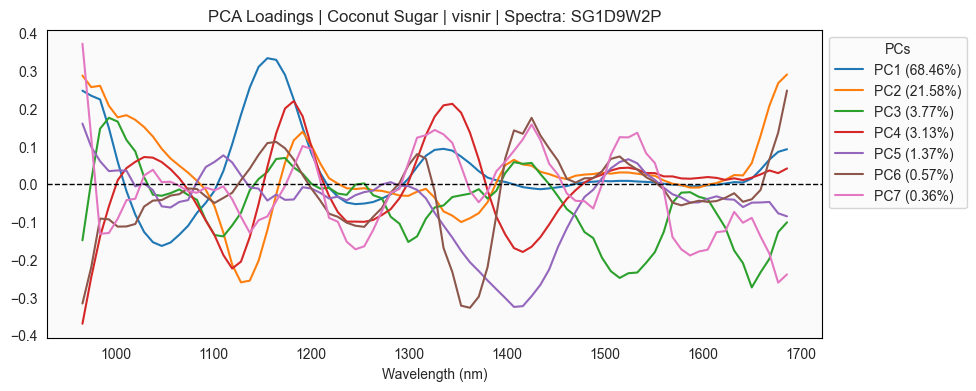

Total Explained Variance: 99.236% 
    Number of Components: 7


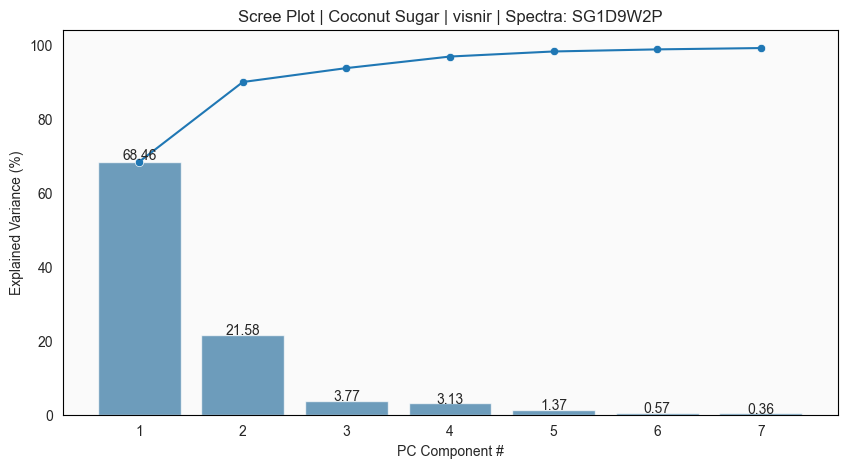

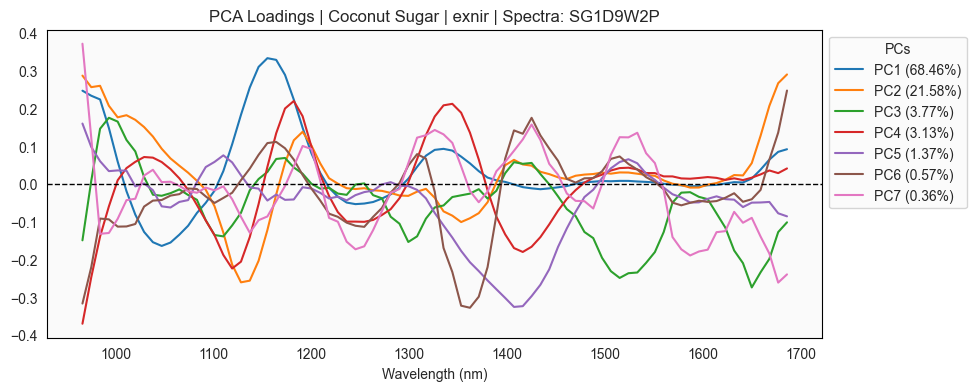

Total Explained Variance: 99.236% 
    Number of Components: 7


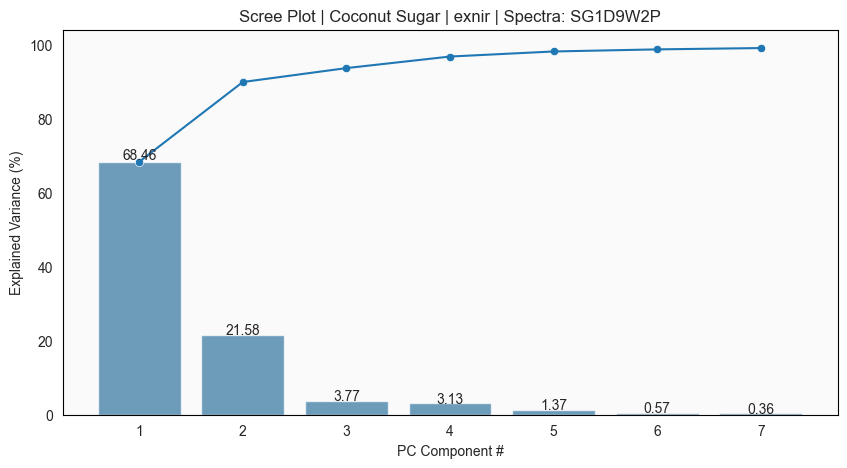

In [102]:
N_COMP = 0.99
RANDOM_STATE = 42
for spectrum in spectra:
    SAMPLE_TYPE = f'{label} | {spectrum}'
    plot_df = spectra_meta[f'{spectrum}_plot_df']

    fitted_pc, pc_labels = fit_pca(plot_df, N_COMP, RANDOM_STATE)

    spectra_meta = {
            **spectra_meta,
            f'{spectrum}_fitted_pc' : fitted_pc,
            f'{spectrum}_pc_labels' : pc_labels,
            }

    fig2, ax2 = plot_loadings(plot_df, fitted_pc, pc_labels, 
                            spec_prep=PREPROCESSING, 
                            sample_type=SAMPLE_TYPE)
    
    plt.savefig(output_dir/f'pca_loadings_{spectrum}', bbox_inches='tight')
    plt.show()
    plt.close()
    

    fig1, ax1 = plot_scree(fitted_pc,
                        spec_prep=PREPROCESSING, 
                        sample_type=SAMPLE_TYPE)    

    print(f"""Total Explained Variance: {fitted_pc.explained_variance_ratio_.sum()*100:.3f}% 
    Number of Components: {len(fitted_pc.explained_variance_ratio_)}""")

    plt.savefig(output_dir/f'scree_{spectrum}', bbox_inches='tight')
    plt.show()
    plt.close()

Assigned visnir_spectra to spectra_df
Assigned visnir_label to label_df


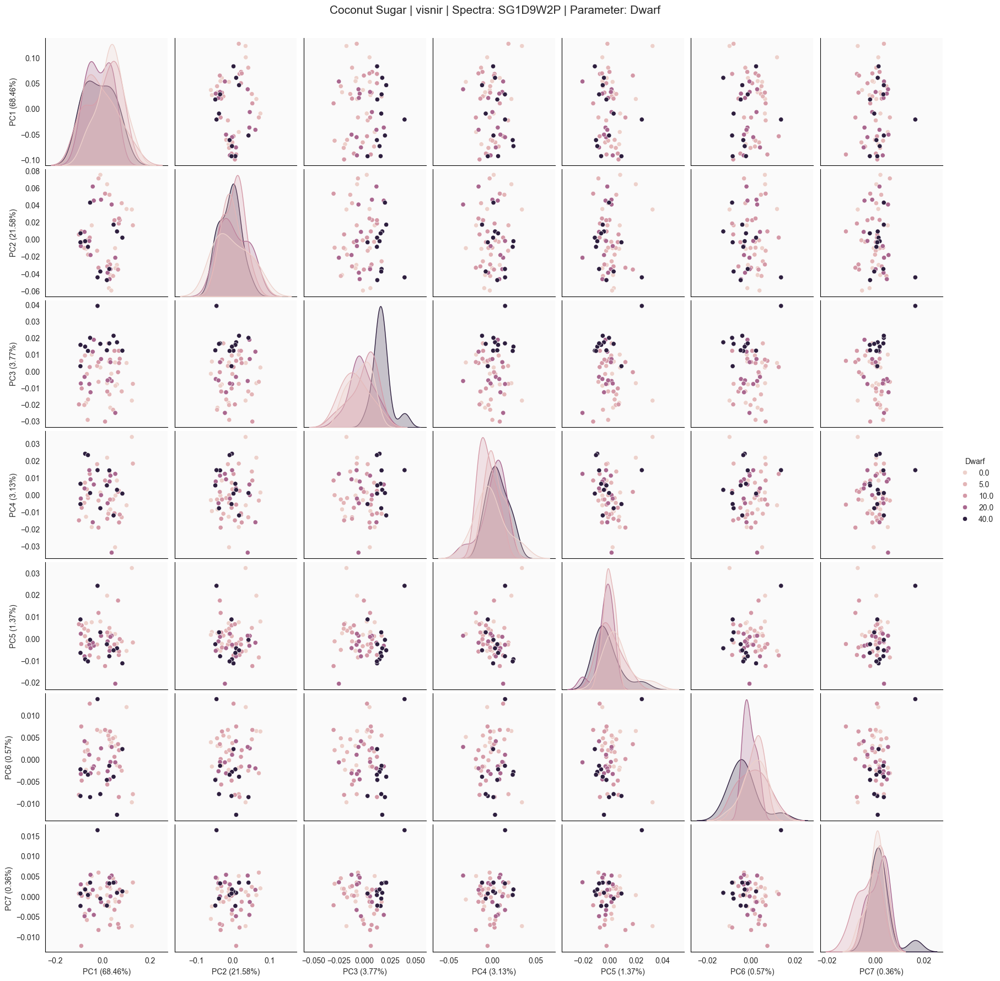

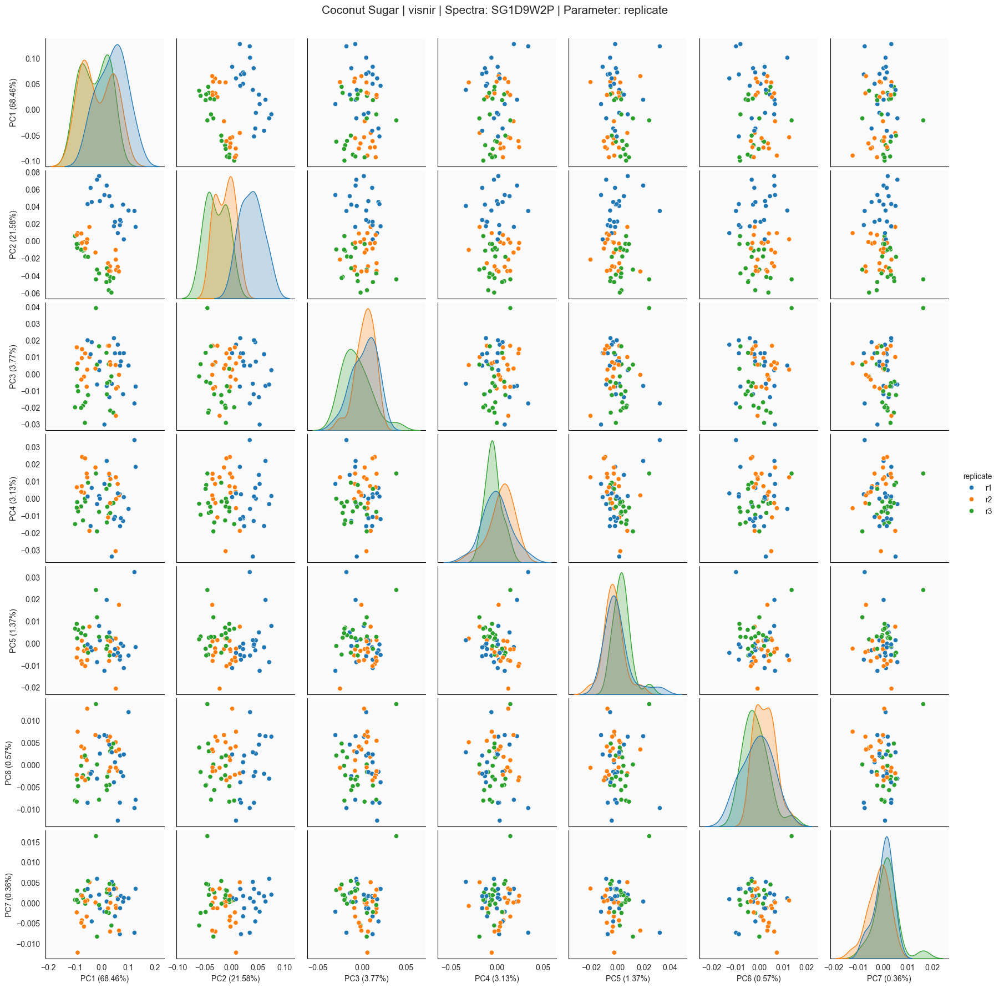

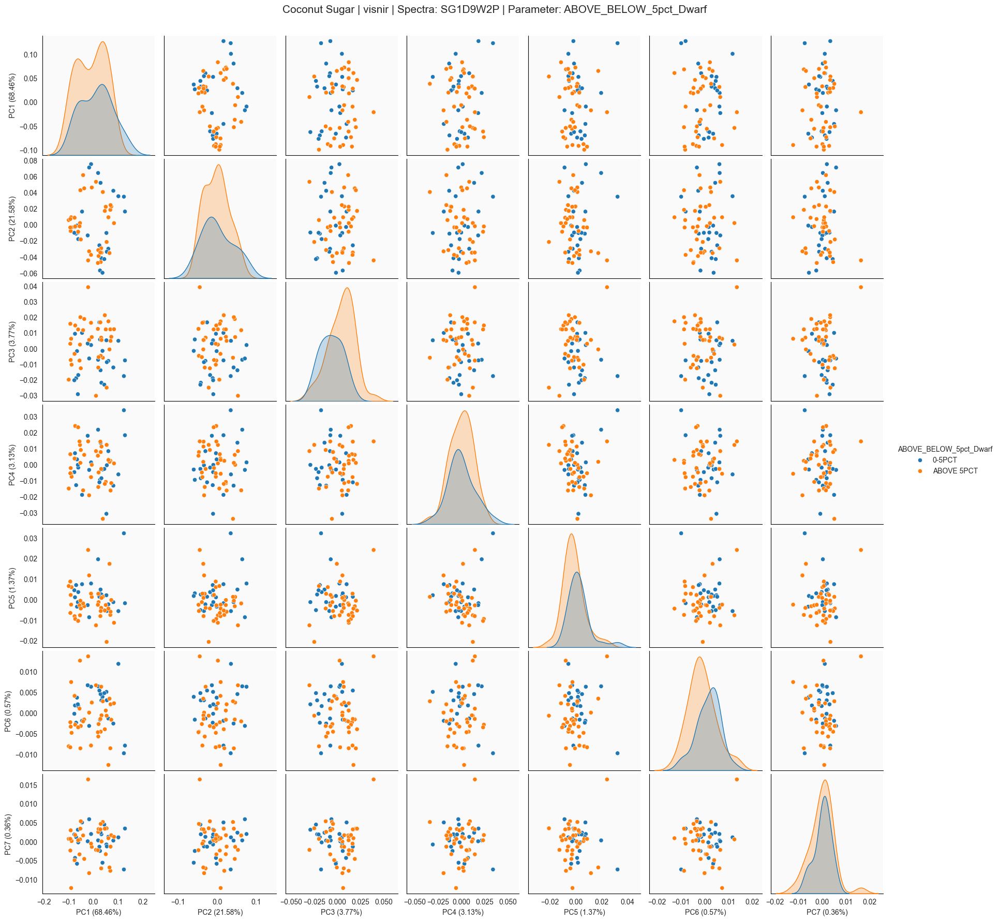

Assigned exnir_spectra to spectra_df
Assigned exnir_label to label_df


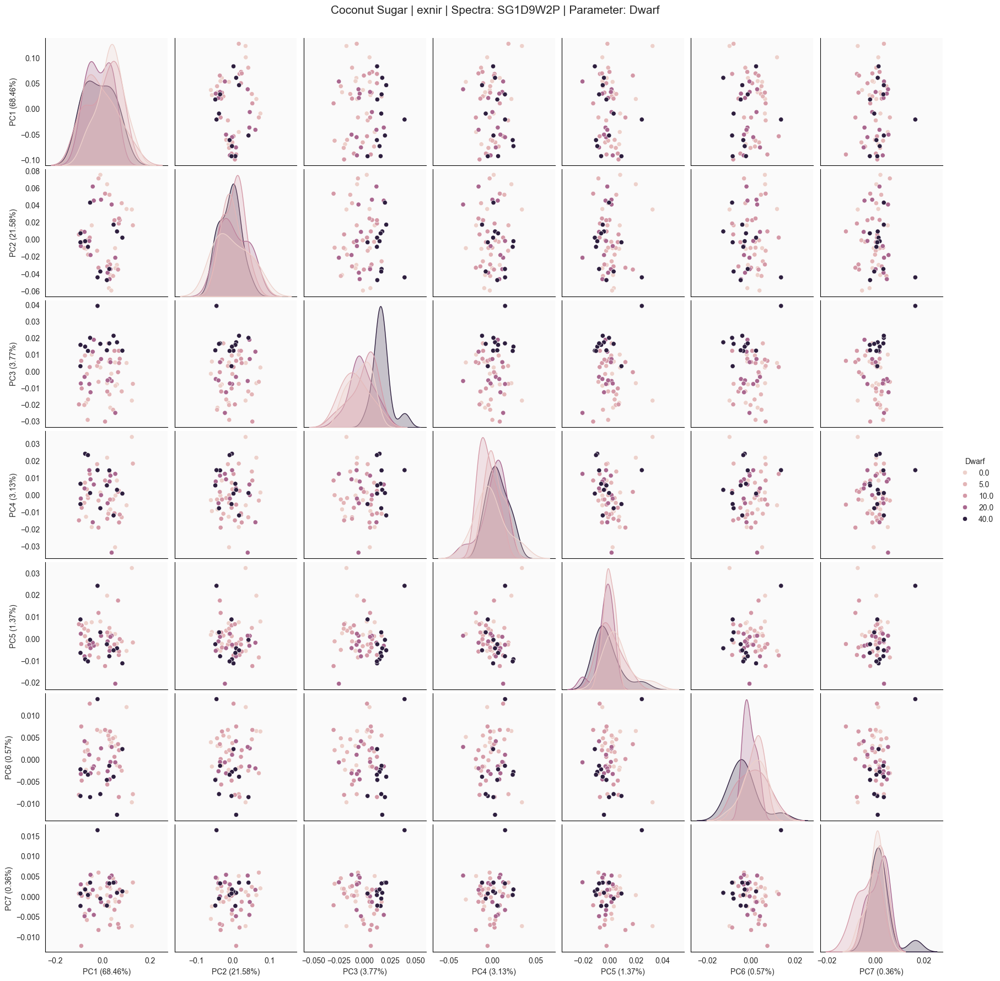

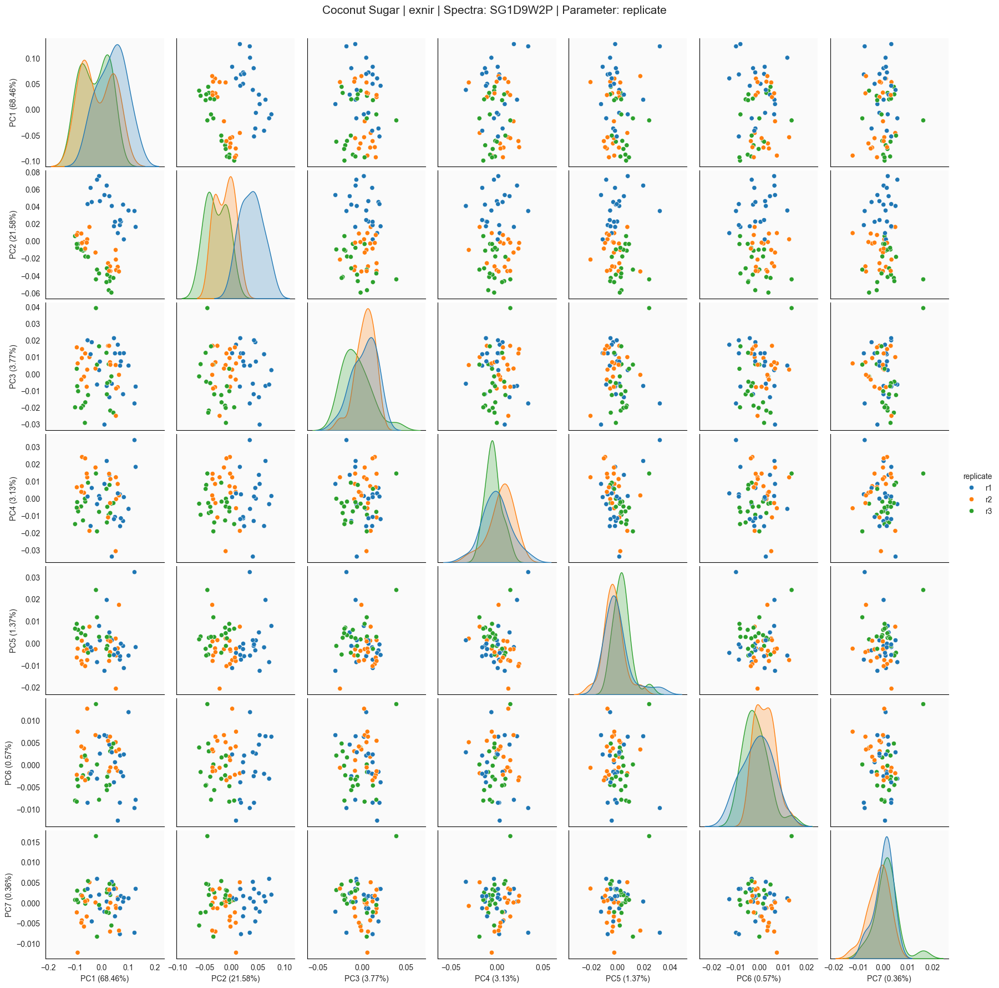

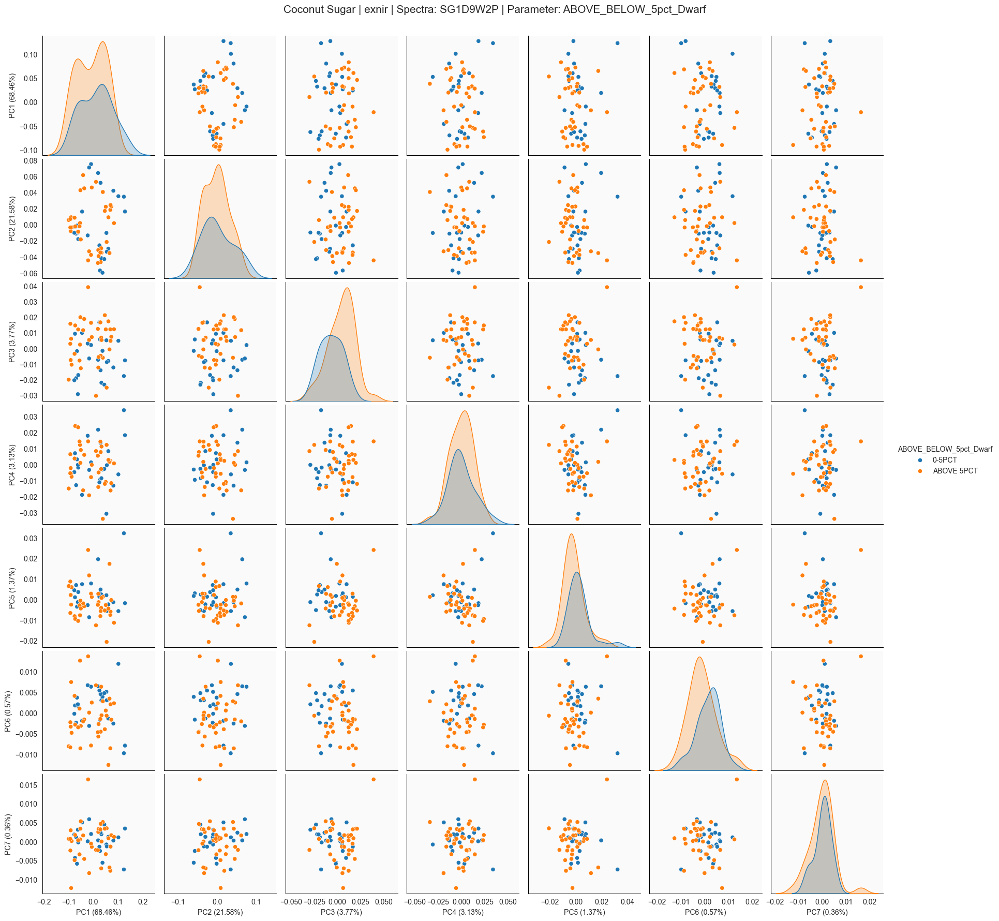

In [103]:
for spectrum in spectra:
    SAMPLE_TYPE = f'{label} | {spectrum}'

    for split in data_split:
        key = f'{spectrum}_{split}'
        if key in cleaned_spectra:
            if split == 'spectra':
                selected_df = cleaned_spectra[key]
            elif split == 'label':
                selected_labels = cleaned_spectra[key]
            print(f'Assigned {key} to {split}_df')
    
    plot_df = spectra_meta[f'{spectrum}_plot_df']
    fitted_pc = spectra_meta[f'{spectrum}_fitted_pc']
    pc_labels = spectra_meta[f'{spectrum}_pc_labels']

    for param in param_label_map.keys():
        pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=selected_labels[[param]])
        sns.pairplot(data=pc_df.reset_index().drop('lot_id', axis=1), hue=param)
        plt.suptitle(f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING} | Parameter: {param}', y=1.02, size=15)
        plt.savefig(output_dir/f'pca_{spectrum}_{param}', bbox_inches='tight')
        plt.show()
        plt.close()

In [104]:
# N_COMP = 0.93
# RANDOM_STATE = 42

# fitted_pc, pc_labels = fit_pca(plot_df, N_COMP, RANDOM_STATE)

# for param in param_label_map.keys():
#     pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df[[param]])
#     g = sns.pairplot(data=pc_df.reset_index().drop('lot_id', axis=1), hue=param, height=5)

#     # Set to track which indices have been labeled
#     labeled_indices = set()
#     label_all = 'yes'

#     # Add data labels (annotations)
#     for i, j in zip(*np.tril_indices_from(g.axes, -1)):  # Iterate over the lower triangular part of the plot matrix
#         ax = g.axes[i, j]  # Access each subplot
#         xlabel = g.x_vars[j]  # Get the variable name for the x-axis
#         ylabel = g.y_vars[i]  # Get the variable name for the y-axis
        
#         for k in range(pc_df.shape[0]):  # Iterate through the rows of the dataframe
#             index_label = pc_df.index[k]  # Get the index label
#             # if label_all == 'yes' and pc_df['type'].iloc[k] == 'VLSFO':
#             if label_all == 'yes' and index_label in (80079,80069,80059,80061): #80064,80060
#                 ax.annotate(index_label, (pc_df.iloc[k][xlabel], pc_df.iloc[k][ylabel]), fontsize=7, ha='left')
#             # else:
#                 if index_label not in labeled_indices:  # Check if the index has already been labeled
#                     ax.annotate(index_label, (pc_df.iloc[k][xlabel], pc_df.iloc[k][ylabel]), fontsize=8, ha='left')
#                     labeled_indices.add(index_label)  # Mark this index as labeled            

#     plt.suptitle(f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING} | Parameter: {param}', y=1.02, size=15)
#     plt.show()

In [105]:
# fig = make_subplots(rows=3, cols= 2, 
#                     subplot_titles=['F Test Spectra', 'F Test PCA', 
#                                     'Mutual Info Spectra', 'Mutual Info PCA',
#                                     'Chi2 Spectra', 'Chi2 PCA'],
#                     specs=[[{'secondary_y': True}, {'secondary_y': True}],
#                            [{'secondary_y': False}, {'secondary_y': False}],
#                            [{'secondary_y': True}, {'secondary_y': True}]],
#                     horizontal_spacing=0.15,
#                     vertical_spacing=0.1)

# title = f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING}'
# colors = px.colors.qualitative.Plotly
# pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df)
# n_comp = fitted_pc.n_components_

# for i, param in enumerate(param_label_map.keys()):
#     try:
#         f_reg_spec = f_classif(plot_df, label_df[param].values.ravel())
#         f_reg_pca = f_classif(pc_df.iloc[:, :n_comp], pc_df[param].values.ravel())
#         mms = MinMaxScaler()
#         scaled_spec = mms.fit_transform(plot_df)
#         scaled_pca = mms.fit_transform(pc_df.iloc[:, :n_comp])
#         mi_spec = mutual_info_classif(scaled_spec, label_df[param].values.ravel())
#         mi_pca = mutual_info_classif(scaled_pca, pc_df[param].values.ravel())
#         chi2_spec = chi2(scaled_spec, label_df[param].values.ravel())
#         chi2_pca = chi2(scaled_pca, pc_df[param].values.ravel())
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=mi_spec, marker_color=colors[i], name=param,
#                        opacity=0.8, showlegend=False),
#                        secondary_y=False,row=2, col=1)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=mi_pca, name=param, marker_color=colors[i],
#                        showlegend=False, opacity=0.8),
#                     secondary_y=False, row=2, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=2)
        
#     except:
#         pass

# # Add figure title
# fig.update_layout(title_text=title, height=1400, width=1400)
# fig.update_xaxes(title_text="Wavelengths (nm)", col=1)
# fig.update_xaxes(title_text="No. of PCs", col=2)

# # Set y-axes titles
# fig.update_yaxes(title_text="F value", secondary_y=False, row=1)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=1)
# fig.update_yaxes(title_text="Mutual Information", secondary_y=False, row=2)
# fig.update_yaxes(title_text="Chi2", secondary_y=False, row=3)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=3)

# fig.show()

# SNV-SG1D9W2P

In [396]:
# # CONFIGS
# msc = SavitzkyGolay(deriv=1, window=9, polyorder=2)
# msc_df = pd.DataFrame(msc.fit_transform(SNV().fit_transform(raw_df)), 
#                       columns=raw_df.columns[4:-4], index=raw_df.index)
# plot_df = msc_df.copy()
# PREPROCESSING = 'SNV-SG1D4W2P'

In [397]:
# for param, label_type in param_label_map.items():
#     plot_spectra(plot_df, labels=label_df[[param]],
#                  label_type=label_type,
#                  spec_prep=PREPROCESSING,
#                  sample_type=SAMPLE_TYPE,
#                  cmap=cmap)

In [398]:
# N_COMP = 0.95
# RANDOM_STATE = 42

# fitted_pc, pc_labels = fit_pca(plot_df, N_COMP, RANDOM_STATE)
# fig2, ax2 = plot_loadings(plot_df, fitted_pc, pc_labels, 
#                           spec_prep=PREPROCESSING, 
#                           sample_type=SAMPLE_TYPE)
# fig1, ax1 = plot_scree(fitted_pc,
#                        spec_prep=PREPROCESSING, 
#                        sample_type=SAMPLE_TYPE)
# print(f"""Total Explained Variance: {fitted_pc.explained_variance_ratio_.sum()*100:.3f}% 
# Number of Components: {len(fitted_pc.explained_variance_ratio_)}""")

In [399]:
# for param in param_label_map.keys():
#     pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df[[param]])
#     sns.pairplot(data=pc_df.reset_index().drop('lot_id', axis=1), hue=param)
#     plt.suptitle(f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING} | Parameter: {param}', y=1.02, size=15)

In [400]:
# fig = make_subplots(rows=3, cols= 2, 
#                     subplot_titles=['F Test Spectra', 'F Test PCA', 
#                                     'Mutual Info Spectra', 'Mutual Info PCA',
#                                     'Chi2 Spectra', 'Chi2 PCA'],
#                     specs=[[{'secondary_y': True}, {'secondary_y': True}],
#                            [{'secondary_y': False}, {'secondary_y': False}],
#                            [{'secondary_y': True}, {'secondary_y': True}]],
#                     horizontal_spacing=0.15,
#                     vertical_spacing=0.1)

# title = f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING}'
# colors = px.colors.qualitative.Plotly
# pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df)
# n_comp = fitted_pc.n_components_

# for i, param in enumerate(param_label_map.keys()):
#     try:
#         f_reg_spec = f_classif(plot_df, label_df[param].values.ravel())
#         f_reg_pca = f_classif(pc_df.iloc[:, :n_comp], pc_df[param].values.ravel())
#         mms = MinMaxScaler()
#         scaled_spec = mms.fit_transform(plot_df)
#         scaled_pca = mms.fit_transform(pc_df.iloc[:, :n_comp])
#         mi_spec = mutual_info_classif(scaled_spec, label_df[param].values.ravel())
#         mi_pca = mutual_info_classif(scaled_pca, pc_df[param].values.ravel())
#         chi2_spec = chi2(scaled_spec, label_df[param].values.ravel())
#         chi2_pca = chi2(scaled_pca, pc_df[param].values.ravel())
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=mi_spec, marker_color=colors[i], name=param,
#                        opacity=0.8, showlegend=False),
#                        secondary_y=False,row=2, col=1)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=mi_pca, name=param, marker_color=colors[i],
#                        showlegend=False, opacity=0.8),
#                     secondary_y=False, row=2, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=2)
        
#     except:
#         pass

# # Add figure title
# fig.update_layout(title_text=title, height=1400, width=1400)
# fig.update_xaxes(title_text="Wavelengths (nm)", col=1)
# fig.update_xaxes(title_text="No. of PCs", col=2)

# # Set y-axes titles
# fig.update_yaxes(title_text="F value", secondary_y=False, row=1)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=1)
# fig.update_yaxes(title_text="Mutual Information", secondary_y=False, row=2)
# fig.update_yaxes(title_text="Chi2", secondary_y=False, row=3)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=3)

# fig.show()

# SG2D9W2P

In [97]:
data_split = ['spectra', 'label']
spectra_meta = {}

msc = SavitzkyGolay(deriv=2, window=9, polyorder=2)
PREPROCESSING = 'SG2D9W2P'

output_dir = Path(f"../data/visualization/{PREPROCESSING}")
output_dir.mkdir(exist_ok=True, parents=True)

In [ ]:
for spectrum in spectra:

    for split in data_split:
        key = f'{spectrum}_{split}'
        if key in cleaned_spectra:
            if split == 'spectra':
                selected_df = cleaned_spectra[key]
            elif split == 'label':
                selected_labels = cleaned_spectra[key]
            print(f'Assigned {key} to {split}_df')
    
    SAMPLE_TYPE = f'{label} | {spectrum}'

    # CONFIGS
    msc_df = pd.DataFrame(msc.fit_transform(raw_df), 
                      columns=raw_df.columns[4:-4], index=raw_df.index)
    plot_df = msc_df.copy()

    spectra_meta = {
        **spectra_meta,
        f'{spectrum}_plot_df' : plot_df
    }
    
    for param, label_type in param_label_map.items():
        plot_spectra(plot_df, labels=selected_labels[[param]],
                    label_type=label_type,
                    spec_prep=PREPROCESSING,
                    sample_type=SAMPLE_TYPE,
                    cmap=cmap)
        plt.savefig(output_dir/f'spectra_{spectrum}_{param}', bbox_inches='tight')
        plt.close()

In [ ]:
N_COMP = 0.99
RANDOM_STATE = 42
for spectrum in spectra:
    SAMPLE_TYPE = f'{label} | {spectrum}'
    plot_df = spectra_meta[f'{spectrum}_plot_df']

    fitted_pc, pc_labels = fit_pca(plot_df, N_COMP, RANDOM_STATE)

    spectra_meta = {
            **spectra_meta,
            f'{spectrum}_fitted_pc' : fitted_pc,
            f'{spectrum}_pc_labels' : pc_labels,
            }

    fig2, ax2 = plot_loadings(plot_df, fitted_pc, pc_labels, 
                            spec_prep=PREPROCESSING, 
                            sample_type=SAMPLE_TYPE)
    
    plt.savefig(output_dir/f'pca_loadings_{spectrum}', bbox_inches='tight')
    plt.show()
    plt.close()
    

    fig1, ax1 = plot_scree(fitted_pc,
                        spec_prep=PREPROCESSING, 
                        sample_type=SAMPLE_TYPE)    

    print(f"""Total Explained Variance: {fitted_pc.explained_variance_ratio_.sum()*100:.3f}% 
    Number of Components: {len(fitted_pc.explained_variance_ratio_)}""")

    plt.savefig(output_dir/f'scree_{spectrum}', bbox_inches='tight')
    plt.show()
    plt.close()

In [ ]:
for spectrum in spectra:
    SAMPLE_TYPE = f'{label} | {spectrum}'

    for split in data_split:
        key = f'{spectrum}_{split}'
        if key in cleaned_spectra:
            if split == 'spectra':
                selected_df = cleaned_spectra[key]
            elif split == 'label':
                selected_labels = cleaned_spectra[key]
            print(f'Assigned {key} to {split}_df')
    
    plot_df = spectra_meta[f'{spectrum}_plot_df']
    fitted_pc = spectra_meta[f'{spectrum}_fitted_pc']
    pc_labels = spectra_meta[f'{spectrum}_pc_labels']

    for param in param_label_map.keys():
        pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=selected_labels[[param]])
        sns.pairplot(data=pc_df.reset_index().drop('lot_id', axis=1), hue=param)
        plt.suptitle(f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING} | Parameter: {param}', y=1.02, size=15)
        plt.savefig(output_dir/f'pca_{spectrum}_{param}', bbox_inches='tight')
        plt.show()
        plt.close()

In [ ]:
# fig = make_subplots(rows=3, cols= 2, 
#                     subplot_titles=['F Test Spectra', 'F Test PCA', 
#                                     'Mutual Info Spectra', 'Mutual Info PCA',
#                                     'Chi2 Spectra', 'Chi2 PCA'],
#                     specs=[[{'secondary_y': True}, {'secondary_y': True}],
#                            [{'secondary_y': False}, {'secondary_y': False}],
#                            [{'secondary_y': True}, {'secondary_y': True}]],
#                     horizontal_spacing=0.15,
#                     vertical_spacing=0.1)

# title = f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING}'
# colors = px.colors.qualitative.Plotly
# pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df)
# n_comp = fitted_pc.n_components_

# for i, param in enumerate(param_label_map.keys()):
#     try:
#         f_reg_spec = f_classif(plot_df, label_df[param].values.ravel())
#         f_reg_pca = f_classif(pc_df.iloc[:, :n_comp], pc_df[param].values.ravel())
#         mms = MinMaxScaler()
#         scaled_spec = mms.fit_transform(plot_df)
#         scaled_pca = mms.fit_transform(pc_df.iloc[:, :n_comp])
#         mi_spec = mutual_info_classif(scaled_spec, label_df[param].values.ravel())
#         mi_pca = mutual_info_classif(scaled_pca, pc_df[param].values.ravel())
#         chi2_spec = chi2(scaled_spec, label_df[param].values.ravel())
#         chi2_pca = chi2(scaled_pca, pc_df[param].values.ravel())
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=mi_spec, marker_color=colors[i], name=param,
#                        opacity=0.8, showlegend=False),
#                        secondary_y=False,row=2, col=1)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=mi_pca, name=param, marker_color=colors[i],
#                        showlegend=False, opacity=0.8),
#                     secondary_y=False, row=2, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=2)
        
#     except:
#         pass

# # Add figure title
# fig.update_layout(title_text=title, height=1400, width=1400)
# fig.update_xaxes(title_text="Wavelengths (nm)", col=1)
# fig.update_xaxes(title_text="No. of PCs", col=2)

# # Set y-axes titles
# fig.update_yaxes(title_text="F value", secondary_y=False, row=1)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=1)
# fig.update_yaxes(title_text="Mutual Information", secondary_y=False, row=2)
# fig.update_yaxes(title_text="Chi2", secondary_y=False, row=3)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=3)

# fig.show()

# SNV-SG2D9W2P

In [ ]:
# # CONFIGS
# msc = SavitzkyGolay(deriv=2, window=9, polyorder=2)
# msc_df = pd.DataFrame(msc.fit_transform(SNV().fit_transform(raw_df)), 
#                       columns=raw_df.columns[4:-4], index=raw_df.index)
# plot_df = msc_df.copy()
# PREPROCESSING = 'SNV-SG2D9W2P'

In [ ]:
# for param, label_type in param_label_map.items():
#     plot_spectra(plot_df, labels=label_df[[param]],
#                  label_type=label_type,
#                  spec_prep=PREPROCESSING,
#                  sample_type=SAMPLE_TYPE,
#                  cmap=cmap)

In [ ]:
# N_COMP = 0.93
# RANDOM_STATE = 42

# fitted_pc, pc_labels = fit_pca(plot_df, N_COMP, RANDOM_STATE)
# fig2, ax2 = plot_loadings(plot_df, fitted_pc, pc_labels, 
#                           spec_prep=PREPROCESSING, 
#                           sample_type=SAMPLE_TYPE)
# fig1, ax1 = plot_scree(fitted_pc,
#                        spec_prep=PREPROCESSING, 
#                        sample_type=SAMPLE_TYPE)
# print(f"""Total Explained Variance: {fitted_pc.explained_variance_ratio_.sum()*100:.3f}% 
# Number of Components: {len(fitted_pc.explained_variance_ratio_)}""")

In [ ]:
# for param in param_label_map.keys():
#     pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df[[param]])
#     sns.pairplot(data=pc_df.reset_index().drop('lot_id', axis=1), hue=param)
#     plt.suptitle(f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING} | Parameter: {param}', y=1.02, size=15)

In [ ]:
# fig = make_subplots(rows=3, cols= 2, 
#                     subplot_titles=['F Test Spectra', 'F Test PCA', 
#                                     'Mutual Info Spectra', 'Mutual Info PCA',
#                                     'Chi2 Spectra', 'Chi2 PCA'],
#                     specs=[[{'secondary_y': True}, {'secondary_y': True}],
#                            [{'secondary_y': False}, {'secondary_y': False}],
#                            [{'secondary_y': True}, {'secondary_y': True}]],
#                     horizontal_spacing=0.15,
#                     vertical_spacing=0.1)

# title = f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING}'
# colors = px.colors.qualitative.Plotly
# pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df)
# n_comp = fitted_pc.n_components_

# for i, param in enumerate(param_label_map.keys()):
#     try:
#         f_reg_spec = f_classif(plot_df, label_df[param].values.ravel())
#         f_reg_pca = f_classif(pc_df.iloc[:, :n_comp], pc_df[param].values.ravel())
#         mms = MinMaxScaler()
#         scaled_spec = mms.fit_transform(plot_df)
#         scaled_pca = mms.fit_transform(pc_df.iloc[:, :n_comp])
#         mi_spec = mutual_info_classif(scaled_spec, label_df[param].values.ravel())
#         mi_pca = mutual_info_classif(scaled_pca, pc_df[param].values.ravel())
#         chi2_spec = chi2(scaled_spec, label_df[param].values.ravel())
#         chi2_pca = chi2(scaled_pca, pc_df[param].values.ravel())
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=mi_spec, marker_color=colors[i], name=param,
#                        opacity=0.8, showlegend=False),
#                        secondary_y=False,row=2, col=1)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=mi_pca, name=param, marker_color=colors[i],
#                        showlegend=False, opacity=0.8),
#                     secondary_y=False, row=2, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=2)
        
#     except:
#         pass

# # Add figure title
# fig.update_layout(title_text=title, height=1400, width=1400)
# fig.update_xaxes(title_text="Wavelengths (nm)", col=1)
# fig.update_xaxes(title_text="No. of PCs", col=2)

# # Set y-axes titles
# fig.update_yaxes(title_text="F value", secondary_y=False, row=1)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=1)
# fig.update_yaxes(title_text="Mutual Information", secondary_y=False, row=2)
# fig.update_yaxes(title_text="Chi2", secondary_y=False, row=3)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=3)

# fig.show()